# *Data-driven collective variables for enhanced sampling* - **Analysis**

This notebook contains the code used in the paper "Data-driven collective variables for enhanced sampling" by Bonati, Rizzi and Parrinello (2019).

# Setup and methods

### Modules

In [0]:
!pip3 install torch==1.1.0 torchvision==0.3.0 -f https://download.pytorch.org/whl/torch_stable.html

In [0]:
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable

In [0]:
import os
import numpy as np
import scipy 
import matplotlib.pyplot as plt
import pandas as pd
import itertools
import progressbar

### Palette

In [0]:
###################################################################
# Fessa palette for python matplotlib
###################################################################
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

def hex_to_rgb(value):
    value = value.lstrip('#')
    lv = len(value)
    rgb=tuple(int(value[i:i + lv // 3], 16) for i in range(0, lv, lv // 3))
    return tuple([x/255. for x in rgb])


paletteFessa = [
          hex_to_rgb("#1F3B73"),
          hex_to_rgb("#2F9294"),
          hex_to_rgb("#50B28D"),
          hex_to_rgb("#A7D655"),
          hex_to_rgb("#FFE03E"),
          hex_to_rgb("#FFA955"),
          hex_to_rgb("#D6573B")
         ]

cm_fessa = LinearSegmentedColormap.from_list("fessa", paletteFessa, N=1000)

matplotlib.colors.ColorConverter.colors['fessa1'] = paletteFessa[0]
matplotlib.colors.ColorConverter.colors['fessa2'] = paletteFessa[1]
matplotlib.colors.ColorConverter.colors['fessa3'] = paletteFessa[2]
matplotlib.colors.ColorConverter.colors['fessa4'] = paletteFessa[3]
matplotlib.colors.ColorConverter.colors['fessa5'] = paletteFessa[4]
matplotlib.colors.ColorConverter.colors['fessa6'] = paletteFessa[5]
matplotlib.colors.ColorConverter.colors['fessa7'] = paletteFessa[6]

fessaNames=['fessa1', 'fessa2' , 'fessa3', 'fessa4', 
              'fessa5', 'fessa6' , 'fessa7']

# Usage examples
# For contour plots
# plt.contourf(X,Y,Z,cmap=cm_fessa)
# For standard plots
# plt.plot(x,y,color=paletteFessa[0])
# or
# plt.plot(x,y,color='fessa1')

## Datasets

In [0]:
class ColvarDataset(Dataset):
    """COLVAR dataset"""

    def __init__(self, colvar_list):
        self.nstates = len( colvar_list )
        self.colvar = colvar_list
        
    def __len__(self):
        return len(self.colvar[0])

    def __getitem__(self, idx):
        x = ()
        for i in range(self.nstates):
            x += (self.colvar[i][idx],)
        return x
    
#useful for cycling over the test dataset even if it is smaller than the training set
def cycle(iterable):
    while True:
        for x in iterable:
            yield x

## NN architecture

In [0]:
##################################
# Define Networks
##################################

class NN_DeepLDA(nn.Module):
    
    def __init__(self, l ):
        super(NN_DeepLDA, self).__init__()
        
        #Encoder architecture
        modules=[]
        for i in range( len(l)-1 ):
            print(l[i],' --> ', l[i+1], end=' ')
            if( i<len(l)-2 ):
                modules.append(nn.Linear(l[i], l[i+1]) )
                modules.append( nn.ReLU(True) )
                print("(relu)")
            else:
                modules.append(nn.Linear(l[i], l[i+1]) )
                #modules.append(nn.Dropout(p=0.2))
                print("")
                
        self.nn = nn.Sequential(*modules)
        
        #norm option
        self.normIn = False
        
    def set_norm(self, Mean: torch.Tensor, Range: torch.Tensor):
        self.normIn = True
        self.Mean = Mean
        self.Range = Range
        
    def normalize(self, x: Variable):
        batch_size = x.size(0)
        x_size = x.size(1)
        
        Mean = self.Mean.unsqueeze(0).expand(batch_size, x_size)
        Range = self.Range.unsqueeze(0).expand(batch_size, x_size)
        
        return x.sub(Mean).div(Range)
    
    def get_hidden(self, x: Variable, svd=False, svd_vectors=False, svd_eigen=False, training=False) -> (Variable):
        if(self.normIn):
            x = self.normalize(x)   
        z = self.nn(x)
        return z

    def set_lda(self, x: torch.Tensor):
        #Parameter(torch.Tensor(out_features, in_features)
        self.lda = nn.Parameter(x.unsqueeze(0), requires_grad=False) 

    def get_lda(self) -> (torch.Tensor):
        return self.lda

    def apply_lda(self, x: Variable) -> (Variable):
        z = torch.nn.functional.linear(x,self.lda)
        return z
        
    def forward(self, x: Variable) -> (Variable):
        z = self.get_hidden(x,svd=False)
        z = self.apply_lda(z)
        return z

    def get_cv(self, x: Variable) -> (Variable):
        return self.forward(x)
    
    

## Loss function

In [0]:
# -- loss function --
def LDAloss_cholesky(H, label, test_routines=False):
    #sizes
    N, d = H.shape
    
    #H = H*1e2

    # Mean centered observations for entire population
    H_bar = H - torch.mean(H, 0, True)
    #Total scatter matrix (cov matrix over all observations)
    S_t = H_bar.t().matmul(H_bar) / (N - 1)
    #Define within scatter matrix and compute it
    S_w = torch.Tensor().new_zeros((d, d), device = device, dtype = dtype)    
    S_w_inv = torch.Tensor().new_zeros((d, d), device = device, dtype = dtype)
    buf = torch.Tensor().new_zeros((d, d), device = device, dtype = dtype)
    #Loop over classes to compute means and covs
    for i in range(categ):
        #check which elements belong to class i
        H_i = H[torch.nonzero(label == i).view(-1)]
        # compute mean centered obs of class i
        H_i_bar = H_i - torch.mean(H_i, 0, True)
        # count number of elements
        N_i = H_i.shape[0]
        if N_i == 0:
            continue
        
        #LDA
        S_w += H_i_bar.t().matmul(H_i_bar) / ((N_i - 1) * categ)
        
        ######HLDA
        #inv_i = H_i_bar.t().matmul(H_i_bar) / ((N_i - 1) * categ)
        #S_w_inv += inv_i.pinverse()       
        
    #S_w = S_w_inv.pinverse()
    #END HLDA#########        

    S_b = S_t - S_w

    S_w = S_w + lambdA * torch.diag(torch.Tensor().new_ones((d), device = device, dtype = dtype))

    ## Generalized eigenvalue problem: S_b * v_i = lambda_i * Sw * v_i 

    # (1) use cholesky decomposition for S_w
    L = torch.cholesky(S_w,upper=False)

    # (2) define new matrix using cholesky decomposition and 
    L_t = torch.t(L)
    L_ti = torch.inverse(L_t)
    L_i = torch.inverse(L)
    S_new = torch.matmul(torch.matmul(L_i,S_b),L_ti)

    # (3) solve  S_new * w_i = lambda_i * w_i
    eig_values, eig_vectors = torch.symeig(S_new,eigenvectors=True)
    eig_vectors = eig_vectors.t()
    # (4) sort eigenvalues and retrieve old eigenvector 
    #eig_values, ind = torch.sort(eig_values, 0, descending=True)
    max_eig_vector = eig_vectors[-1]   
    max_eig_vector = torch.matmul(L_ti,max_eig_vector)
    norm=max_eig_vector.pow(2).sum().sqrt()
    max_eig_vector.div_(norm)

    loss = - eig_values[-1]

    return loss, eig_values, max_eig_vector, S_b, S_w

In [0]:
def check_LDA_cholesky(loader, model):
    with torch.no_grad():
        for data in loader:
            X,y = data[0].float().to(device),data[1].long().to(device)
            H  = model.get_hidden(X)
            _, eig_values, eig_vector, _, _ = LDAloss_cholesky(H, y)
    return eig_values, eig_vector

## Encode (for analysis)

In [0]:
def encode_hidden(loader,model,batch,n_hidden,device):
    """Compute the compressed representation for an entire dataset (with two classes A and B)"""
    s=np.empty((len(loader),batch,n_hidden))
    l=np.empty((len(loader),batch))
    for i,data in enumerate(loader):
        x,lab = data[0].float(),data[1].long()
        x = Variable(x).to(device)
        cv = model.get_hidden(x,svd=False)
        #cv = model.apply_pca(cv)
        s[i] = cv.detach().cpu().numpy()
        l[i] = lab
        
    s=s.reshape(len(loader)*batch,n_hidden)
    s=s[0:len(loader)*batch]

    l=l.reshape(len(loader)*batch)
    l=l[0:len(loader)*batch]
    
    sA = s[l==0]
    sB = s[l==1]

    return sA,sB

def encode_cv(loader,model,batch,n_cv,device):
    """Compute the compressed representation for an entire dataset (with two classes A and B)"""
    s=np.empty((len(loader),batch,n_cv))
    l=np.empty((len(loader),batch))
    for i,data in enumerate(loader):
        x,lab = data[0].float(),data[1].long()
        x = Variable(x).to(device)
        cv = model(x)
        s[i] = cv.detach().cpu().numpy()
        l[i] = lab
        
    s=s.reshape(len(loader)*batch,n_cv)
    s=s[0:len(loader)*batch]

    l=l.reshape(len(loader)*batch)
    l=l[0:len(loader)*batch]
    
    sA = s[l==0]
    sB = s[l==1]

    return sA,sB

def encode_cv_all(loader,model,batch,n_cv,device):
    """Compute the compressed representation for an entire dataset (with two classes A and B)"""
    s=np.empty((len(loader),batch,n_cv))
    l=np.empty((len(loader),batch))
    for i,data in enumerate(loader):
        x,lab = data[0].float(),data[1].long()
        x = Variable(x).to(device)
        cv = model.get_cv(x)
        s[i] = cv.detach().cpu().numpy()
        l[i] = lab
        
    s=s.reshape(len(loader)*batch,n_cv)
    s=s[0:len(loader)*batch]

    l=l.reshape(len(loader)*batch)
    l=l[0:len(loader)*batch]

    return s,l

## Plot functions with save opt

In [0]:
def plot_results(save=False,testing=False,accuracy=False,chem_space=False):
    ngrid=3
    if accuracy:
        ngrid=4
        if chem_space:
            ngrid=5
    for i in range(ngrid):
        with grid.output_to(0,i):
            grid.clear_cell()
    with grid.output_to(0,0):
        plot_training(save)
    with grid.output_to(0,1):
        plot_H(save,testing)
    with grid.output_to(0,2):
        plot_CV(save,testing)
    if accuracy:
        with grid.output_to(0,3):
            plot_accuracy(save,testing)
        if chem_space:
            with grid.output_to(0,4):
                plot_chem_space(save)

def plot_training(save=False):
    pylab.figure(figsize=(5, 5))
    pylab.title("Deep-LDA optimization")
    pylab.plot(np.asarray(ep),np.asarray(eig),'.-', c='tab:green', label='batch')
    pylab.plot(np.asarray(ep),np.asarray(eig_t),'.-', c='tab:grey', label='population')
    pylab.xlabel("Epoch")
    pylab.ylabel("1st Eigenvalue")
    pylab.legend()
    if save:
        pylab.savefig("{}/{}.png".format(tr_folder, "training"),dpi=150)

def plot_accuracy(save=False,testing=False):
    pylab.figure(figsize=(5, 5))
    pylab.title("Classification accuracy")
    pylab.plot(np.asarray(ep),100*np.asarray(acc),'.-', c='tab:cyan', label='training')
    if testing:
        pylab.plot(np.asarray(ep),100*np.asarray(acc_t),'.-', c='tab:orange', label='testing')
    pylab.xlabel("Epoch")
    pylab.ylabel("Accuracy (%)")
    pylab.legend()
    if save:
        pylab.savefig("{}/{}.png".format(tr_folder, "accuracy"),dpi=150)

def plot_H(save=False,testing=False):
    pylab.figure(figsize=(5, 5))
    pylab.title("LDA on Hidden-space H")
    # -- Testing and Validation histograms --
    trA,trB = encode_hidden(valid_loader_labels,model,batch_val,n_hidden,device)
    eigen=max_eig_vector.detach().numpy()

    pylab.scatter(trA[:,0],trA[:,1], c='tab:red', label='trA',alpha=0.3)
    pylab.scatter(trB[:,0],trB[:,1], c='tab:blue', label='trB',alpha=0.3)

    if testing:
        ttA,ttB = encode_hidden(test_meta_labels,model,batch_test,n_hidden,device)
        pylab.scatter(ttA[:,0],ttA[:,1], c='tab:orange', label='testA',s=0.2, alpha=0.5)
        pylab.scatter(ttB[:,0],ttB[:,1], c='tab:cyan', label='testB',s=0.2, alpha=0.5)
        mIN=np.min([np.min(trA[:,0]),np.min(trB[:,0]),np.min(ttA[:,0]),np.min(ttB[:,0])])
        mAX=np.max([np.max(trA[:,0]),np.max(trB[:,0]),np.max(ttA[:,0]),np.max(ttB[:,0])])
    else:
        mIN=np.min([np.min(trA[:,0]),np.min(trB[:,0])])
        mAX=np.max([np.max(trA[:,0]),np.max(trB[:,0])])

    x=np.linspace(mIN,mAX,100)
    y=-eigen[0]/eigen[1]*x+0
    #pylab.plot(x,y, linewidth=2, label='DeepLDA')
    pylab.legend() 
    if save:
        pylab.savefig("{}/{}.png".format(tr_folder, "hidden"),dpi=150)

def plot_CV(save=False,testing=False):
    sA,sB = encode_cv(valid_loader_labels,model,batch_val,n_cv,device)
    sA,sB = sA[:,0], sB[:,0]
    if testing:
        stA,stB = encode_cv(test_meta_labels,model,batch_test,n_cv,device)
        stA,stB = stA[:,0], stB[:,0]

        min_s=np.min([np.min(sA),np.min(sB),np.min(stA),np.min(stB)])
        max_s=np.max([np.max(sA),np.max(sB),np.max(stA),np.max(stB)])
    else:
        min_s=np.min([np.min(sA),np.min(sB)])
        max_s=np.max([np.max(sA),np.max(sB)])
    
    b=np.linspace(min_s,max_s,100)

    pylab.figure(figsize=(5, 5))
    pylab.title("Deep-LDA CV Histogram")
    pylab.hist(sA, bins=b, ls='dashed', alpha = 0.7, lw=2, color='tab:red', label='trA',density=True)
    pylab.hist(sB, bins=b, ls='dashed', alpha = 0.7, lw=2, color='tab:blue', label='trB',density=True)

    if testing:
        pylab.hist(stA, bins=b, ls='dashed', alpha = 0.5, lw=2, color='tab:orange', label='testA',density=True)
        pylab.hist(stB, bins=b, ls='dashed', alpha = 0.5, lw=2, color='tab:cyan', label='testB',density=True)

    pylab.legend()
    if save:
        pylab.savefig("{}/{}.png".format(tr_folder, "histogram"), dpi=150)

def plot_chem_space(save):
    s,l = encode_cv_all(test_meta_ord_labels,model,batch_test,n_cv,device)
    s = s[:,0]

    x = de_cc
    y = de_oh1

    x = x[:len(s)]
    y = y[:len(s)]

    pylab.figure(figsize=(5,5))
    scat = pylab.scatter(x,y,c=s,cmap=cm_fessa,s=1.)
    pylab.colorbar(scat)
    if save:
        pylab.savefig("{}/{}.png".format(tr_folder, "chem_space"), dpi=150)


# Ala2

### TRAJECTORY

In [0]:
folder=main_folder+"ala2/"

data_meta=np.loadtxt(folder+"COLVAR")

In [0]:
data=data_meta
ev=1
fr=1
upto=20000
time,deep,deeplda,phi,psi,opes_bias,opes_ci = data[fr:upto:ev,0],data[fr:upto:ev,1],data[fr:upto:ev,2],data[fr:upto:ev,3],data[fr:upto:ev,4],data[fr:upto:ev,9],data[fr:upto:ev,11]
print(time.shape)

(19999,)


In [0]:
def format_func(value, tick_number):
    # find number of multiples of pi/2
    N = int(np.round(2 * value / np.pi))
    if N == 0:
        return "0"
    elif N == 1:
        return r"$\pi/2$"
    elif N == 2:
        return r"$\pi$"
    elif N == -2:
        return r"$-\pi$"
    elif N == -1:
        return r"$-\pi/2$"
    elif N % 2 > 0:
        return r"${0}\pi/2$".format(N)
    else:
        return r"${0}\pi$".format(N // 2)

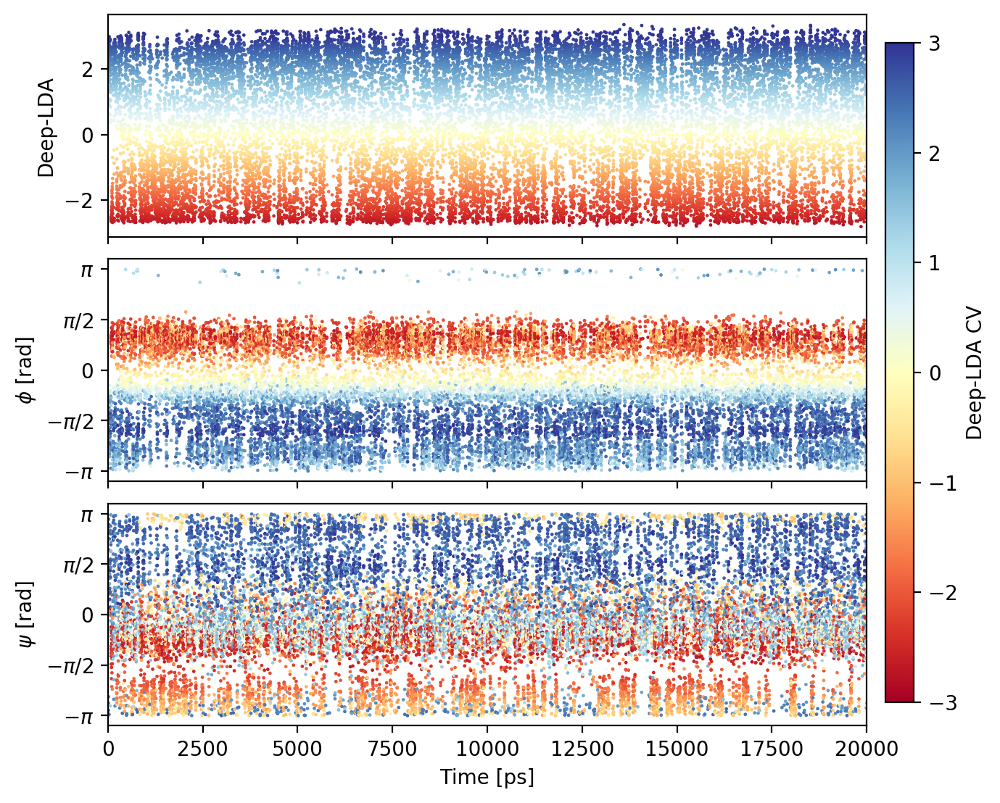

In [0]:
fig, (ax1,ax2,ax3) = plt.subplots(3,sharex=True, figsize=(6.5,6.5), dpi=200)

pp1=ax1.scatter(time,deeplda,c=deeplda,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.)
pp2=ax2.scatter(time,phi,c=deeplda,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.)
pp3=ax3.scatter(time,psi,c=deeplda,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.)

ax1.set_xlim(0,20000)
#ax.set_title("Deep-LDA simulation")
ax3.set_xlabel("Time [ps]")

ax1.set_ylabel(r"Deep-LDA")
ax2.set_ylabel(r"$\phi$ [rad]")
ax3.set_ylabel(r"$\psi$ [rad]")

ax2.yaxis.set_major_locator(plt.MultipleLocator(np.pi / 2))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(format_func))
ax3.yaxis.set_major_locator(plt.MultipleLocator(np.pi / 2))
ax3.yaxis.set_major_formatter(plt.FuncFormatter(format_func))

plt.subplots_adjust(hspace=0.1,right=0.93)
cbar_ax = fig.add_axes([0.95, 0.15, 0.03, 0.7])
cbar=fig.colorbar(pp3, cax=cbar_ax)
cbar.set_label("Deep-LDA CV")

plt.savefig("{}/{}.png".format(folder, "ala2-traj-deep"), dpi=200,bbox_inches='tight')
plt.show()

##### Comparison with phi/psi

In [0]:
folder=main_folder+"ala2/"

data_ref=np.loadtxt(folder+"COLVAR_ref")

In [0]:
data2=data_ref
ev=1
fr=1
upto=20000
time2,deep2,deeplda2,phi2,psi2,opes_bias2,opes_ci2 = data2[fr:upto:ev,0],data2[fr:upto:ev,1],data2[fr:upto:ev,2],data2[fr:upto:ev,3],data2[fr:upto:ev,4],data2[fr:upto:ev,9],data2[fr:upto:ev,11]
print(time.shape)

(19999,)


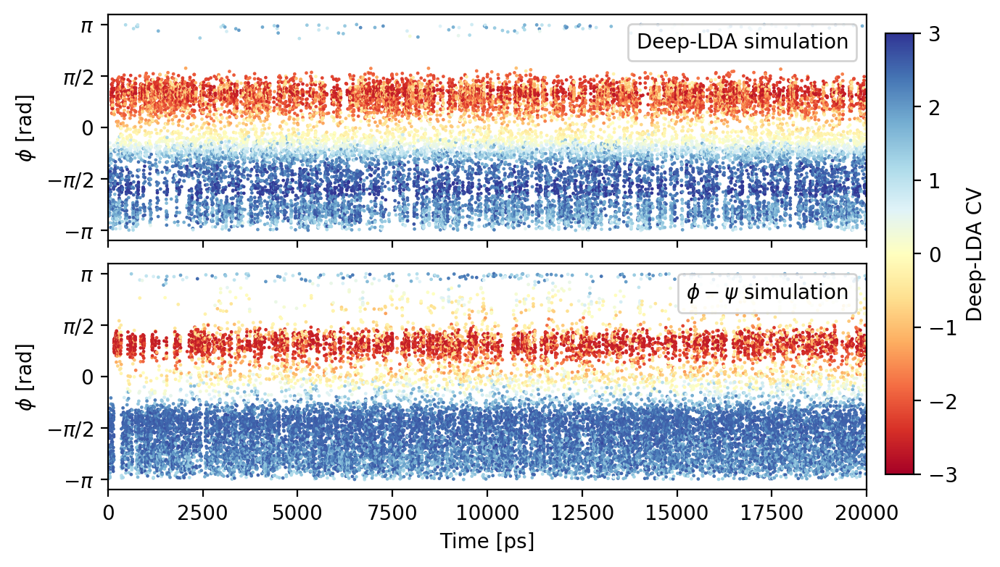

In [0]:
fig, (ax1,ax2) = plt.subplots(2,sharex=True, figsize=(6.5,4.35), dpi=200)

pp1=ax1.scatter(time,phi,c=deeplda,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.,label="Deep-LDA simulation")
pp2=ax2.scatter(time2,phi2,c=deeplda2,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3., label=r"$\phi-\psi$ simulation")

ax1.set_xlim(0,20000)
#ax.set_title("Deep-LDA simulation")
ax2.set_xlabel("Time [ps]")

ax1.set_ylabel(r"$\phi$ [rad]")
ax2.set_ylabel(r"$\phi$ [rad]")

ax1.yaxis.set_major_locator(plt.MultipleLocator(np.pi / 2))
ax1.yaxis.set_major_formatter(plt.FuncFormatter(format_func))
ax2.yaxis.set_major_locator(plt.MultipleLocator(np.pi / 2))
ax2.yaxis.set_major_formatter(plt.FuncFormatter(format_func))

plt.subplots_adjust(hspace=0.1,right=0.93)
cbar_ax = fig.add_axes([0.95, 0.15, 0.03, 0.7])
cbar=fig.colorbar(pp2, cax=cbar_ax)
cbar.set_label("Deep-LDA CV")

for ax in (ax1,ax2):
    ax.legend(loc='upper right',framealpha=0.85,markerscale=0,handletextpad=-2.0)

plt.savefig("{}/{}.png".format(folder, "ala2-traj-compare"), dpi=200,bbox_inches='tight')
plt.show()

### FES

In [0]:
data=data_meta
ev=1
fr=20000
upto=-1
time,deep,deeplda,phi,psi,opes_bias,opes_ci = data[fr:upto:ev,0],data[fr:upto:ev,1],data[fr:upto:ev,2],data[fr:upto:ev,3],data[fr:upto:ev,4],data[fr:upto:ev,9],data[fr:upto:ev,11]
print(time.shape)

(80000,)


#### Compute FES

In [0]:
Kb=0.0083144621 #kj/mol
kbt=Kb*300
gx_min,gx_max=-np.pi,np.pi
gy_min,gy_max=-np.pi,np.pi
grid_bin=100
grid_x=np.linspace(gx_min,gx_max,grid_bin)
grid_y=np.linspace(gy_min,gy_max,grid_bin)
x,y=np.meshgrid(grid_x,grid_y)
period_x=gx_max-gx_min
period_y=gy_max-gy_min

sigma=0.08

cv_x=phi
cv_y=psi

In [0]:
max_prob=0
prob=np.zeros((grid_bin,grid_bin))

pbar = ProgressBar()

for i in pbar(range(grid_bin)):
    for j in range(grid_bin):
        dx=np.absolute(x[i,j]-cv_x)
        dy=np.absolute(y[i,j]-cv_y)
        arg2=(np.minimum(dx,period_x-dx)/sigma)**2+(np.minimum(dy,period_y-dy)/sigma)**2
        prob[i,j]=np.sum(np.exp(opes_bias/kbt)*np.exp(-0.5*arg2))
        if prob[i,j]>max_prob:
            max_prob=prob[i,j]

fes=-kbt*np.log(prob/max_prob)

100% (250 of 250) |######################| Elapsed Time: 0:08:11 Time:  0:08:11


Save FES to file

In [0]:
fname = "fes_kde-" + str(sigma) + ".dat"

with open(folder+fname, 'w') as outf:
    outf.write(("# x \t y \t fes\n"))

    for i in range(grid_bin):
        for j in range(grid_bin):
            outf.write('{}\t{}\t{}\n'.format(x[i,j],y[i,j],fes[i,j]))
        outf.write('\n')


#### Load FES

In [0]:
sigma=0.05
grid_bin=250
folder=main_folder+"ala2/"
fname = "fes_kde-" + str(sigma) + ".dat"
#fname,grid_bin="reference-2d.dat",99

fes=np.loadtxt(folder+fname, usecols=(2),unpack=True)

fes=np.reshape(fes,(grid_bin,grid_bin))

#### Plot FES

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater
  


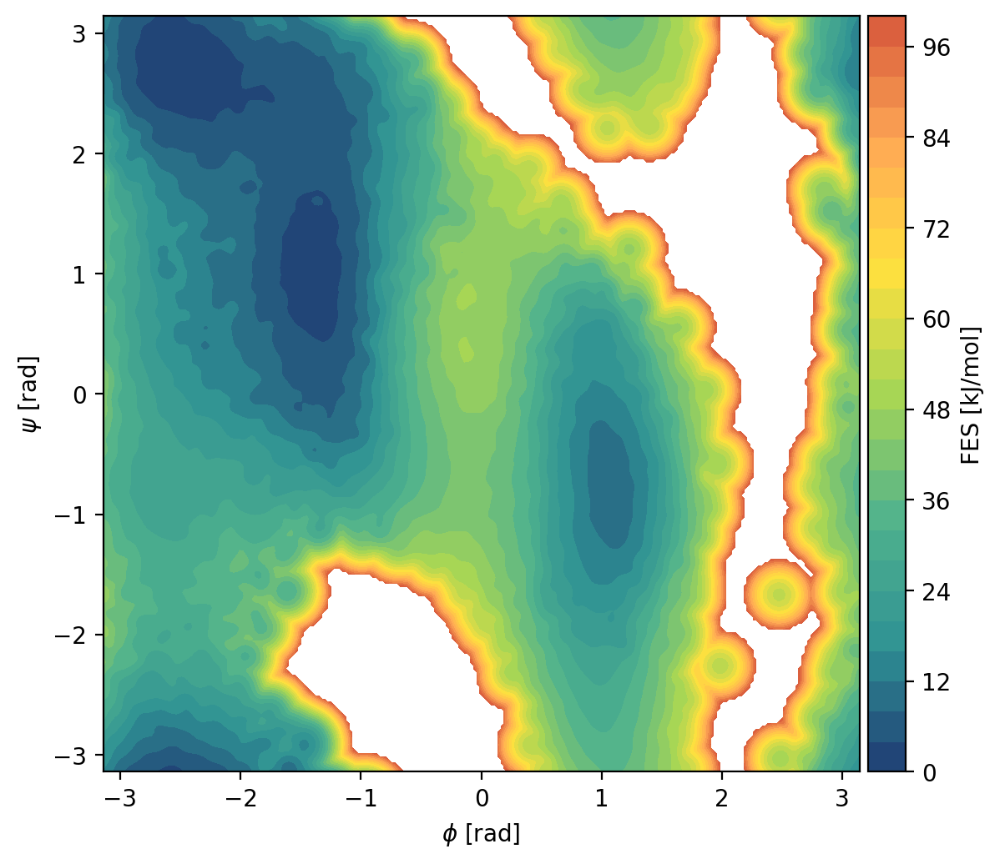

In [0]:
plt.rcParams['axes.facecolor'] = 'white'

#create copy
fes2=fes
max_z=100
fes2[fes2>max_z]=np.NaN

#mask=np.zeros_like(fes2)
#fesA=np.copy(fes2)
#fesA[:,50:]=0
#fesA[fesA==0]=100
#fesB=np.copy(fes2)
#fesB[:,:50]=0
#fesB[fesB==0]=100
#mask[(fesA<25)]=50
#mask[(fesB<32)]=50

#define plot
fig=plt.figure(figsize=(6.5,6), dpi=200)
ax = fig.add_subplot(111)
#plt.pcolor(x,y,fes2,cm_fessa,vmin=0,vmax=250)
#pp=ax.imshow(np.flipud(fes),cmap=cm_fessa,extent=[gx_min,gx_max,gy_min,gy_max],vmax=max_z, interpolation='none')
pp= ax.contourf(fes2, levels=25, cmap=cm_fessa, extent=[gx_min,gx_max,gy_min,gy_max], vmax=max_z)
#pp2=ax.contour(fes2, levels=10, colors='k', linewidths=0.9 , alpha=0.6, extent=[gx_min,gx_max,gy_min,gy_max])
#ax.set_title("Ala2 - FES by reweight")
ax.set_xlabel(r"$\phi$ [rad]")
ax.set_ylabel(r"$\psi$ [rad]")
ax.set_aspect('equal')

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(pp,cax=cax)
cbar.set_label("FES [kJ/mol]")

plt.savefig("{}/{}.png".format(folder, "ala2-fes"), dpi=200, bbox_inches='tight')

### ISOLINES

##### CALCULATE UNBIASED VALUES

In [0]:
folderA=main_folder+"ala2/unbiased/"
folderB=main_folder+"ala2/unbiased/"

all_input=False
only_dist=True
normalize=True

n_dist=45
n_input=n_dist

distA=np.loadtxt(folderA+"INPUTS",usecols=range(1,n_dist+1))
distB=np.loadtxt(folderB+"INPUTS",usecols=range(1,n_dist+1))   

print(distA.shape)

if normalize:
    # normalize inputs
    Max=np.amax(np.concatenate([distA,distB],axis=0),axis=0)
    Min=np.amin(np.concatenate([distA,distB],axis=0),axis=0)

    Mean=(Max+Min)/2.
    Range=(Max-Min)/2.
    Range[Range<1e-6]=1.

    if all_input:
        #do not normalize angles
        Mean[n_dist:]=0.
        Range[n_dist:]=1.

# create labels
lA=np.zeros_like(distA[:,0])
lB=np.ones_like(distB[:,0])

dist=np.concatenate([distA,distB],axis=0)
dist_label=np.concatenate([lA,lB],axis=0)

p = np.random.permutation(len(dist))
dist, dist_label = dist[p], dist_label[p]

#assign equal weights for testing
w=np.ones_like(dist_label)

train_data=20000
batch_tr=2000
train_labels=ColvarDataset([dist[:train_data],dist_label[:train_data],w[:train_data]])
train_loader_labels=DataLoader(train_labels, batch_size=batch_tr,shuffle=True)

valid_data=20000
batch_val=20000
valid_labels=ColvarDataset([dist[:valid_data],dist_label[:valid_data],w[:valid_data]])
#valid_labels=ColvarDataset([dist[train_data:train_data+test_data],dist_label[train_data:train_data+test_data]])
valid_loader_labels=DataLoader(valid_labels, batch_size=batch_val)

#load validation set from meta
folder_meta=main_folder+"deep-lda/ala2/meta_colvar/"
test_dist=np.loadtxt(folder_meta+"INPUTS_and_COLVARmeta",usecols=range(1,n_dist+1))
phi=np.loadtxt(folder_meta+"INPUTS_and_COLVARmeta",usecols=n_input+2)
psi=np.loadtxt(folder_meta+"INPUTS_and_COLVARmeta",usecols=n_input+3)

test_dist_all = test_dist

test_label=np.full(len(phi),-1)
test_label[(phi<-0.5) & (psi>-1)]=0
test_label[(phi>0.25) & (phi <2) & (psi<1) & (psi>-2.75)]=1

plt.figure()
plt.plot(phi[test_label==0])
plt.plot(phi[test_label==1])

p = np.random.permutation(len(test_dist))
test_dist, test_label = test_dist[p], test_label[p]

test_dist = test_dist [test_label != -1]
test_label = test_label [test_label != -1]

testA=test_dist[test_label==0]
testB=test_dist[test_label==1]

print(testA.shape)
print(testB.shape)

test_data=10000
batch_test=5000

test_meta=ColvarDataset([testA[:test_data],testB[:test_data]])
test_meta_loader=DataLoader(test_meta, batch_size=batch_test)

test_meta_l=ColvarDataset([test_dist[:test_data],test_label[:test_data]])
test_meta_labels=DataLoader(test_meta_l, batch_size=batch_test,shuffle=True)

test_unbiased=ColvarDataset([distA[:test_data],distB[:test_data]])
test_unbiased_loader=DataLoader(test_unbiased, batch_size=batch_test)

In [0]:
#trA,trB = encode_cv(valid_loader_labels,model,batch_val,n_cv,device)
trA,trB = encode_cv(valid_loader_labels,model,batch_val,1,'cpu')

a = trA[:,0]
b = trB[:,0]

print("==A==")
print(np.mean(a),np.std(a))
print(np.amin(a),np.amax(a))

print("==B==")
print(np.mean(b),np.std(b))
print(np.amin(b),np.amax(b))

==A==
1.1258117982822813 0.015884041049050016
0.9179863929748535 1.1971324682235718
==B==
-1.1335647718813604 0.014088743943062284
-1.1609447002410889 -0.8973259925842285


##### LOAD MODEL AND TEST SET

In [0]:
folder_meta_ref=main_folder+"ala2/"

phi,psi=np.loadtxt(folder_meta_ref+"COLVAR_phi_psi_ref",usecols=(5,6),unpack=True)
meta_ref_dist=np.loadtxt(folder_meta_ref+"INPUTS_phi_psi_ref")
meta_ref_dist=meta_ref_dist[:,1:]

In [0]:
folder_model=main_folder+"ala2/"
model=torch.jit.load(folder_model+"model.pt")
xx = torch.tensor(meta_ref_dist).float()
deep = model.forward(xx).detach().numpy()
deep=np.reshape(deep, len(deep))
print(deep.shape)

(100001,)


##### ISOLINES PLOT

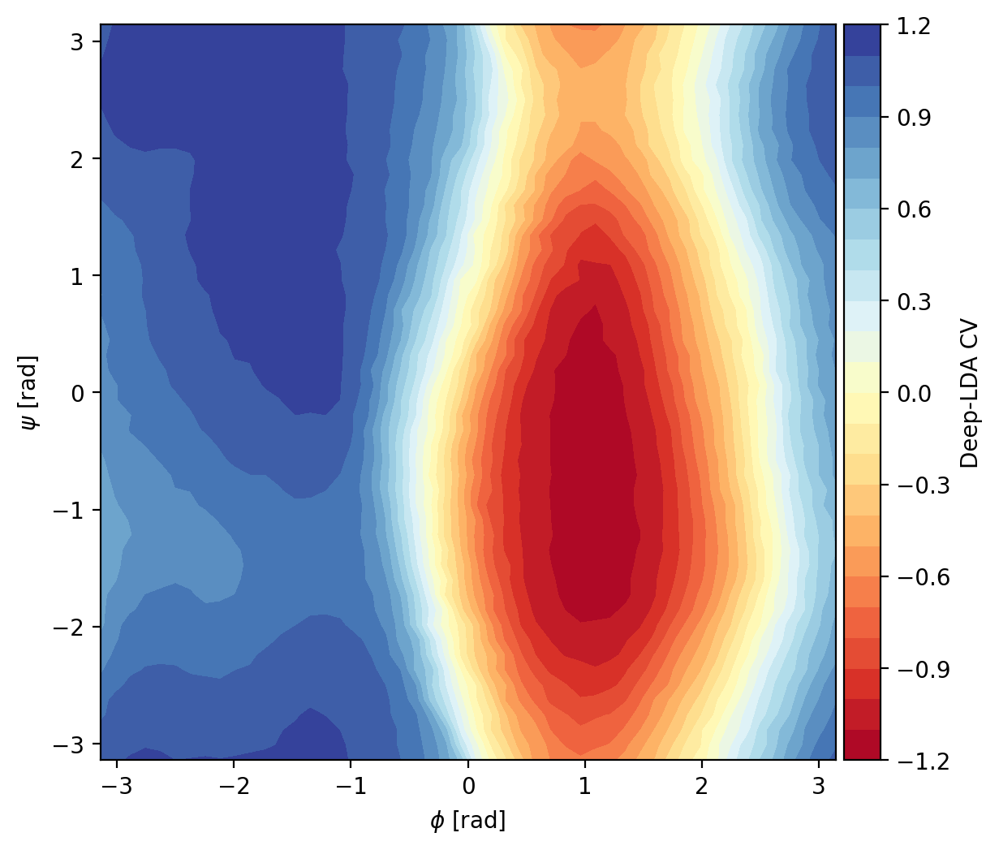

In [0]:
#fig, axs= plt.subplots(figsize=(11,4), nrows=1, ncols=2, dpi=150)

fig, ax= plt.subplots(figsize=(7,6), dpi=200)

bb=[50,50]
lev=25

#load fes
x,y,fes = np.loadtxt(folder_meta_ref+"reference-2d.dat",usecols=(0,1,2),unpack=True)

N = int(len(fes)**.5)
fes = np.reshape(fes,(N, N))

# == DEEP 0 ==
#ax = axs[0]
H, xedges, yedges = np.histogram2d(phi,psi,bins=bb,range=[[-np.pi,np.pi],[-np.pi,np.pi]],weights=deep)
H = H.T
#normalize
H_norm, _ , _ = np.histogram2d(phi,psi,bins=bb,range=[[-np.pi,np.pi],[-np.pi,np.pi]])
H_norm = H_norm.T
H = H/(H_norm)
#plot
#pp = ax.imshow(np.flipud(H), interpolation='gaussian', cmap=cm_fessa, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
#pp = ax.contourf(fes, levels=lev, cmap=cm_fessa, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
pp = ax.contourf(H, levels=lev, cmap='RdYlBu', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
#pp1 = ax.contour(H, levels=np.arange(np.mean(a)-2*np.std(a),np.mean(a)+2*np.std(a),0.01), colors='tab:red', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], linewidths=0.9, alpha=0.8)
#pp2 = ax.contour(H, levels=np.arange(np.mean(b)-2*np.std(b),np.mean(b)+2*np.std(b),0.01), colors='darkblue', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], linewidths=0.9, alpha=0.8)
#pp3 = ax.contour(H, levels=np.arange(-1,1.2,0.2), colors='k', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], linewidths=0.9 , alpha=0.6)

ax.set_aspect('equal')
#ax.set_title("Ala2 - FES and Deep-LDA isolines")
ax.set_xlabel(r"$\phi$ [rad]")
ax.set_ylabel(r"$\psi$ [rad]")

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(pp,cax=cax)

cbar.set_label("Deep-LDA CV")
#cbar.set_label("FES [kJ/mol]")

folder_results=main_folder+"ala2/"
plt.savefig("{}/{}.png".format(folder_results, "ala2-iso"), dpi=200, bbox_inches='tight')

# == DEEP 1 ==
#ax = axs[1]
#plot
#pp = ax.contourf(fes, levels=lev, cmap=cm_fessa, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
#plt.colorbar(pp,ax=ax)
#ax.set_aspect('equal')

#pp1 = ax.contour(H, levels=lev, colors='k', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], linewidths=0.7)

plt.show()


##### ISOLINES AND FES PLOT

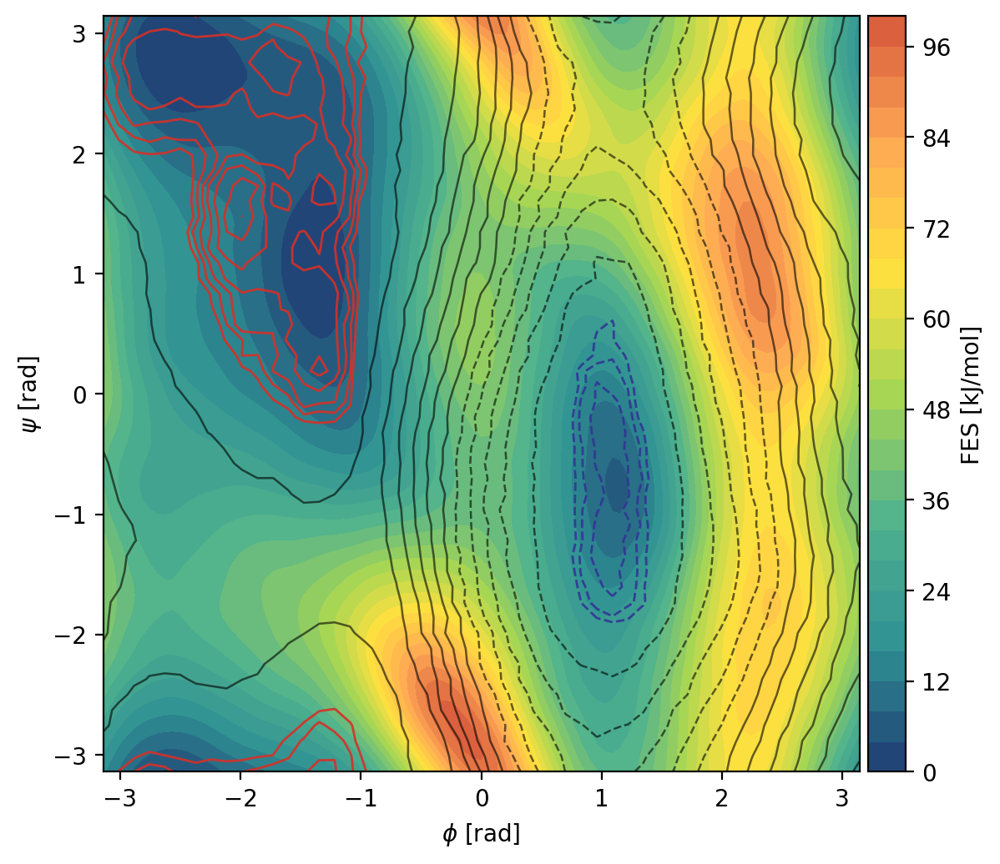

In [0]:
#fig, axs= plt.subplots(figsize=(11,4), nrows=1, ncols=2, dpi=150)

fig, ax= plt.subplots(figsize=(7,6), dpi=200)

bb=[50,50]
lev=25

#load fes
x,y,fes = np.loadtxt(folder_meta_ref+"reference-2d.dat",usecols=(0,1,2),unpack=True)

N = int(len(fes)**.5)
fes = np.reshape(fes,(N, N))

# == DEEP 0 ==
#ax = axs[0]
H, xedges, yedges = np.histogram2d(phi,psi,bins=bb,range=[[-np.pi,np.pi],[-np.pi,np.pi]],weights=deep)
H = H.T
#normalize
H_norm, _ , _ = np.histogram2d(phi,psi,bins=bb,range=[[-np.pi,np.pi],[-np.pi,np.pi]])
H_norm = H_norm.T
H = H/(H_norm)
#plot
#pp = ax.imshow(np.flipud(H), interpolation='gaussian', cmap=cm_fessa, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
pp = ax.contourf(fes, levels=lev, cmap=cm_fessa, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
#pp = ax.contourf(H, levels=lev, cmap='RdBu_r', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
pp1 = ax.contour(H, levels=np.arange(np.mean(a)-2*np.std(a),np.mean(a)+2*np.std(a),0.01), colors='#d73027', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], linewidths=1., alpha=0.9)
pp2 = ax.contour(H, levels=np.arange(np.mean(b)-2*np.std(b),np.mean(b)+2*np.std(b),0.01), colors='#313695', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], linewidths=1., alpha=0.9)
pp3 = ax.contour(H, levels=np.arange(-1,1.2,0.2), colors='k', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], linewidths=0.9 , alpha=0.6)

ax.set_aspect('equal')
#ax.set_title("Ala2 - FES and Deep-LDA isolines")
ax.set_xlabel(r"$\phi$ [rad]")
ax.set_ylabel(r"$\psi$ [rad]")

# create an axes on the right side of ax. The width of cax will be 5%
# of ax and the padding between cax and ax will be fixed at 0.05 inch.
from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(pp,cax=cax)

cbar.set_label("FES [kJ/mol]")

folder_results=main_folder+"ala2/"
plt.savefig("{}/{}.png".format(folder_results, "ala2-fes-iso"), dpi=200, bbox_inches='tight')

# == DEEP 1 ==
#ax = axs[1]
#plot
#pp = ax.contourf(fes, levels=lev, cmap=cm_fessa, extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
#plt.colorbar(pp,ax=ax)
#ax.set_aspect('equal')

#pp1 = ax.contour(H, levels=lev, colors='k', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], linewidths=0.7)

plt.show()


# Aldol reaction

### FES

#### Load data 

In [0]:
folder=main_folder+"aldol/"

data_meta=np.loadtxt(folder+"COLVARmeta")

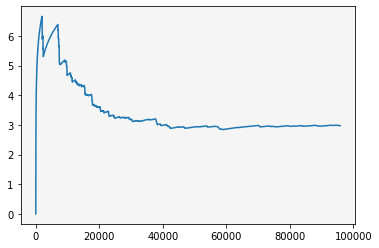

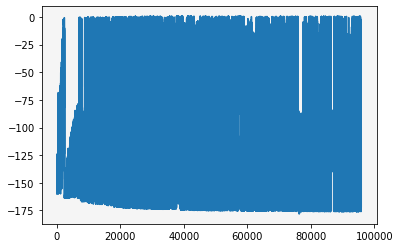

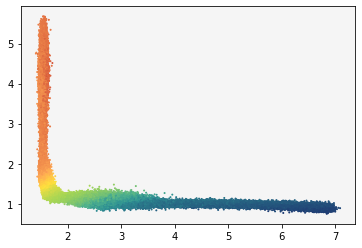

In [0]:
ev=10
data=data_meta
time,d_cc,d_oo,d_oh1,d_oh2,opes_ci,opes_bias,wall_bias,deeplda = data[::ev,0],data[::ev,7],data[::ev,8],data[::ev,9],data[::ev,10],data[::ev,12],data[::ev,14],data[::ev,15],data[::ev,18]

plt.figure()
plt.plot(opes_ci)
plt.figure()
plt.plot(opes_bias)
plt.figure()
plt.scatter(d_cc,d_oh1,c=deeplda,s=1,cmap=cm_fessa)

In [0]:
data=data_meta
ev=10
fr=600000
time,d_cc,d_oo,d_oh1,d_oh2,opes_ci,opes_bias,wall_bias,deeplda = data[fr::ev,0],data[fr::ev,7],data[fr::ev,8],data[fr::ev,9],data[fr::ev,10],data[fr::ev,12],data[fr::ev,14],data[fr::ev,15],data[fr::ev,18]

In [0]:
print( "cc:", np.amin(d_cc),np.amax(d_cc) )
print( "oh1:", np.amin(d_oh1),np.amax(d_oh1) )
print( "oh2:", np.amin(d_oh2),np.amax(d_oh2) )

cc: 1.42707 7.088385
oh1: 0.749503 5.613528
oh2: 0.842221 7.219445


In [0]:
Kb=0.0083144621 #kj/mol
kbt=Kb*300

cc_min,cc_max=0.75,7.5 #cc
oh1_min,oh1_max=0.25,6.25 #oh1
oh2_min,oh2_max=0.25,7.5 #oh2

cv_x=d_cc
cv_y=d_oh1

gx_min,gx_max=cc_min,cc_max
gy_min,gy_max=oh1_min,oh1_max

grid_bin=500#100
grid_x=np.linspace(gx_min,gx_max,grid_bin)
grid_y=np.linspace(gy_min,gy_max,grid_bin)
x,y=np.meshgrid(grid_x,grid_y)

sigma=0.025



#### Compute Fes

##### CC vs OH1

In [0]:
Kb=0.0083144621 #kj/mol
kbt=Kb*300

cv_x=d_cc
cv_y=d_oh1

gx_min,gx_max=cc_min,cc_max
gy_min,gy_max=oh1_min,oh1_max

In [0]:
sigma=0.025
grid_bin=500
grid_x=np.linspace(gx_min,gx_max,grid_bin)
grid_y=np.linspace(gy_min,gy_max,grid_bin)
x,y=np.meshgrid(grid_x,grid_y)

max_prob=0
prob=np.zeros((grid_bin,grid_bin))

bias=opes_bias+wall_bias+80

pbar = ProgressBar()

for i in pbar(range(grid_bin)):
    for j in range(grid_bin):
        if ((x[i,j]>2.25) and (y[i,j]>2)) or (x[i,j]<1) or (y[i,j]<0.5):
            continue 
        dx=np.absolute(x[i,j]-cv_x)
        dy=np.absolute(y[i,j]-cv_y)
        arg2=(dx/sigma)**2+(dy/sigma)**2
        prob[i,j]=np.sum(np.exp(bias/kbt)*np.exp(-0.5*arg2))
        if prob[i,j]>max_prob:
            max_prob=prob[i,j]

fes=-kbt*np.log(prob/max_prob)

100% (500 of 500) |######################| Elapsed Time: 0:03:16 Time:  0:03:16
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in log


In [0]:
#Save FES to file

fname = "fes-cc-oh1_kde-" + str(sigma) + ".dat"

with open(folder+fname, 'w') as outf:
    outf.write(("# x \t y \t fes\n"))

    for i in range(grid_bin):
        for j in range(grid_bin):
            outf.write('{}\t{}\t{}\n'.format(x[i,j],y[i,j],fes[i,j]))
        outf.write('\n')

##### CC vs OH2

In [0]:
Kb=0.0083144621 #kj/mol
kbt=Kb*300

cv_x=d_cc
cv_y=d_oh2

gx_min,gx_max=cc_min,cc_max
gy_min,gy_max=oh2_min,oh2_max

In [0]:
sigma=0.025
grid_bin=500
grid_x=np.linspace(gx_min,gx_max,grid_bin)
grid_y=np.linspace(gy_min,gy_max,grid_bin)
x,y=np.meshgrid(grid_x,grid_y)

max_prob=0
prob=np.zeros((grid_bin,grid_bin))

bias=opes_bias+wall_bias+80

pbar = ProgressBar()

for i in pbar(range(grid_bin)):
    for j in range(grid_bin):
        #if ((x[i,j]>2.25) and (y[i,j]>2)) or (x[i,j]<1) or (y[i,j]<0.5):
            #continue 
        dx=np.absolute(x[i,j]-cv_x)
        dy=np.absolute(y[i,j]-cv_y)
        arg2=(dx/sigma)**2+(dy/sigma)**2
        prob[i,j]=np.sum(np.exp(bias/kbt)*np.exp(-0.5*arg2))
        if prob[i,j]>max_prob:
            max_prob=prob[i,j]

fes=-kbt*np.log(prob/max_prob)

100% (500 of 500) |######################| Elapsed Time: 0:08:36 Time:  0:08:36
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in log


In [0]:
#Save FES to file

fname = "fes-cc-oh2_kde-" + str(sigma) + ".dat"

with open(folder+fname, 'w') as outf:
    outf.write(("# x \t y \t fes\n"))

    for i in range(grid_bin):
        for j in range(grid_bin):
            outf.write('{}\t{}\t{}\n'.format(x[i,j],y[i,j],fes[i,j]))
        outf.write('\n')

##### OH1 vs OH2

In [0]:
Kb=0.0083144621 #kj/mol
kbt=Kb*300

cv_x=d_oh1
cv_y=d_oh2

gx_min,gx_max=oh1_min,oh1_max
gy_min,gy_max=oh2_min,oh2_max

In [0]:
sigma=0.025
grid_bin=500
grid_x=np.linspace(gx_min,gx_max,grid_bin)
grid_y=np.linspace(gy_min,gy_max,grid_bin)
x,y=np.meshgrid(grid_x,grid_y)

max_prob=0
prob=np.zeros((grid_bin,grid_bin))

bias=opes_bias+wall_bias+80

pbar = ProgressBar()

for i in pbar(range(grid_bin)):
    for j in range(grid_bin):
        if ((x[i,j]>2) and (y[i,j]>2)) or (x[i,j]<0.5) or (y[i,j]<0.5):
            continue 
        dx=np.absolute(x[i,j]-cv_x)
        dy=np.absolute(y[i,j]-cv_y)
        arg2=(dx/sigma)**2+(dy/sigma)**2
        prob[i,j]=np.sum(np.exp(bias/kbt)*np.exp(-0.5*arg2))
        if prob[i,j]>max_prob:
            max_prob=prob[i,j]

fes=-kbt*np.log(prob/max_prob)

100% (500 of 500) |######################| Elapsed Time: 0:03:33 Time:  0:03:33
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: divide by zero encountered in log


In [0]:
#Save FES to file

fname = "fes-oh1-oh2_kde-" + str(sigma) + ".dat"

with open(folder+fname, 'w') as outf:
    outf.write(("# x \t y \t fes\n"))

    for i in range(grid_bin):
        for j in range(grid_bin):
            outf.write('{}\t{}\t{}\n'.format(x[i,j],y[i,j],fes[i,j]))
        outf.write('\n')

#### Compute fes and derivatives

In [0]:
max_prob=0
prob=np.zeros((grid_bin,grid_bin),dtype='float128')
derx=np.zeros((grid_bin,grid_bin),dtype='float128')
dery=np.zeros((grid_bin,grid_bin),dtype='float128')

bias=opes_bias+wall_bias
bias=bias+80
bias=np.float128(bias)

pbar = ProgressBar()

for i in pbar(range(grid_bin)):
    for j in range(grid_bin):
        if ((x[i,j]>2.25) and (y[i,j]>2)) or (x[i,j]<1) or (y[i,j]<0.5):
            continue 
        dx=(x[i,j]-cv_x)
        dy=(y[i,j]-cv_y)
        arg2=(dx/sigma)**2+(dy/sigma)**2
        prob[i,j]=np.sum(np.exp(bias/kbt)*np.exp(-0.5*arg2))
        derx[i,j]=np.sum(-dx/(sigma**2)*np.exp(bias/kbt)*np.exp(-0.5*arg2))
        dery[i,j]=np.sum(-dy/(sigma**2)*np.exp(bias/kbt)*np.exp(-0.5*arg2))

        if prob[i,j]>max_prob:
            max_prob=prob[i,j]

fes=-kbt*np.log(prob/max_prob)

#derx/=max_prob #der of prob
#dery/=max_prob
derx=-kbt*derx/prob
dery=-kbt*dery/prob

100% (500 of 500) |######################| Elapsed Time: 0:25:36 Time:  0:25:36
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: divide by zero encountered in log
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide


Save FES and derivatives to file

In [0]:
fname = "fes-with-der_kde-" + str(sigma) + ".dat"

with open(folder+fname, 'w') as outf:
    outf.write(("# x \t y \t fes \t der_x \t der_y \n"))

    for i in range(grid_bin):
        for j in range(grid_bin):
            outf.write('{}\t{}\t{}\t{}\t{}\n'.format(x[i,j],y[i,j],fes[i,j],derx[i,j],dery[i,j]))
        outf.write('\n')


/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Casting input data from 'float128' to 'float64' for imshow
  fig.canvas.print_figure(bytes_io, **kw)


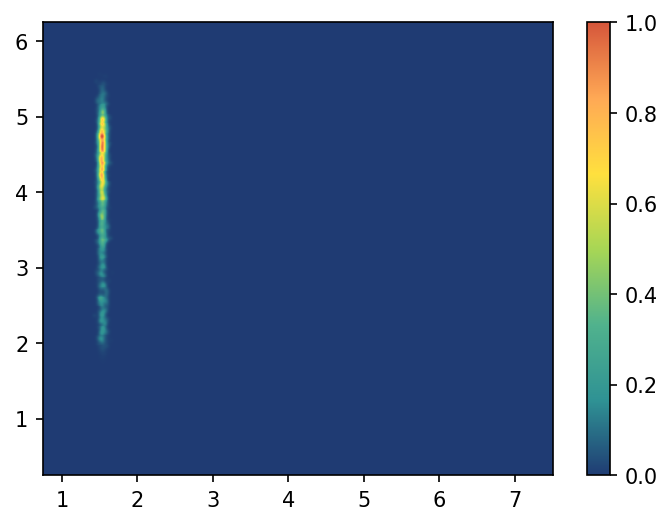

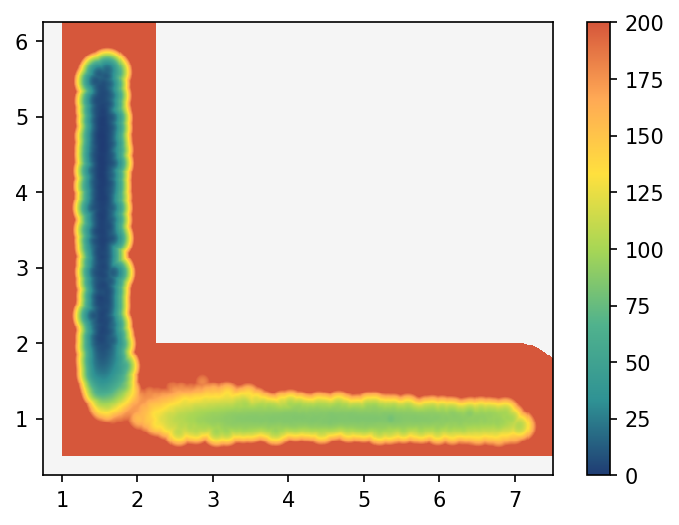

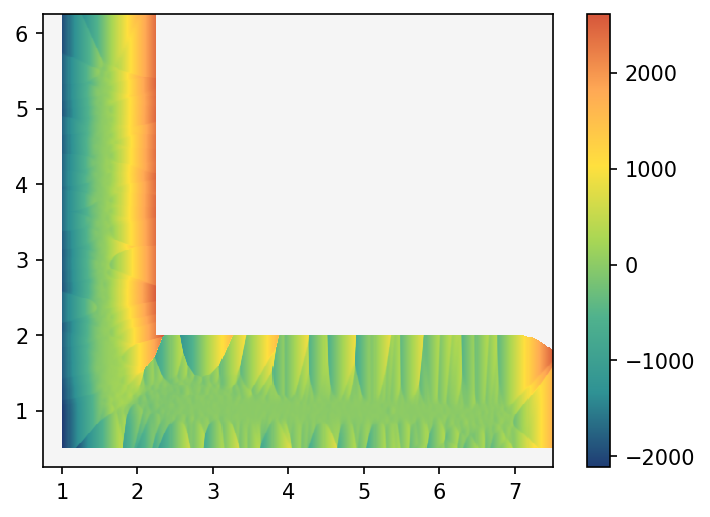

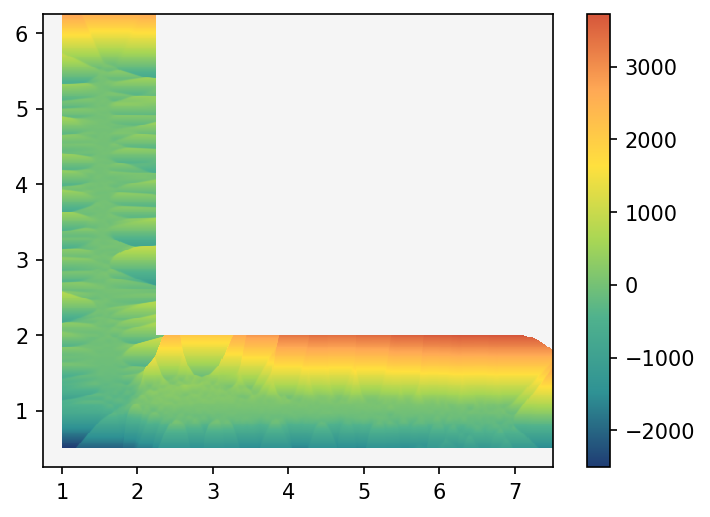

In [0]:
plt.figure(dpi=150)
pp=plt.imshow(np.flipud(prob/max_prob),cmap=cm_fessa,extent=[gx_min,gx_max,gy_min,gy_max],interpolation='none')
plt.colorbar(pp)
plt.show()

plt.figure(dpi=150)
pp=plt.imshow(np.flipud(fes),cmap=cm_fessa,extent=[gx_min,gx_max,gy_min,gy_max],vmin=0,vmax=200,interpolation='none')
plt.colorbar(pp)
plt.show()

plt.figure(dpi=150)
pp=plt.imshow(np.flipud(derx),cmap=cm_fessa,extent=[gx_min,gx_max,gy_min,gy_max],interpolation='none')
plt.colorbar(pp)
plt.show()

plt.figure(dpi=150)
pp=plt.imshow(np.flipud(dery),cmap=cm_fessa,extent=[gx_min,gx_max,gy_min,gy_max],interpolation='none')
plt.colorbar(pp)
plt.show()

plt.show()

#### Load FES

In [0]:
folder=main_folder+"aldol/"


In [0]:
sigma=0.025
folder=main_folder+"aldol/"
fname01 = "fes-cc-oh1_kde-" + str(sigma) + ".dat"
fname02 = "fes-cc-oh2_kde-" + str(sigma) + ".dat"
fname12 = "fes-oh1-oh2_kde-" + str(sigma) + ".dat"

fes01=np.loadtxt(folder+fname01, usecols=(2),unpack=True)
fes02=np.loadtxt(folder+fname02, usecols=(2),unpack=True)
fes12=np.loadtxt(folder+fname12, usecols=(2),unpack=True)

fes01=np.reshape(fes01,(grid_bin,grid_bin))
fes02=np.reshape(fes02,(grid_bin,grid_bin))
fes12=np.reshape(fes12,(grid_bin,grid_bin))


#### Plot FES - cc vs oh1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater
  


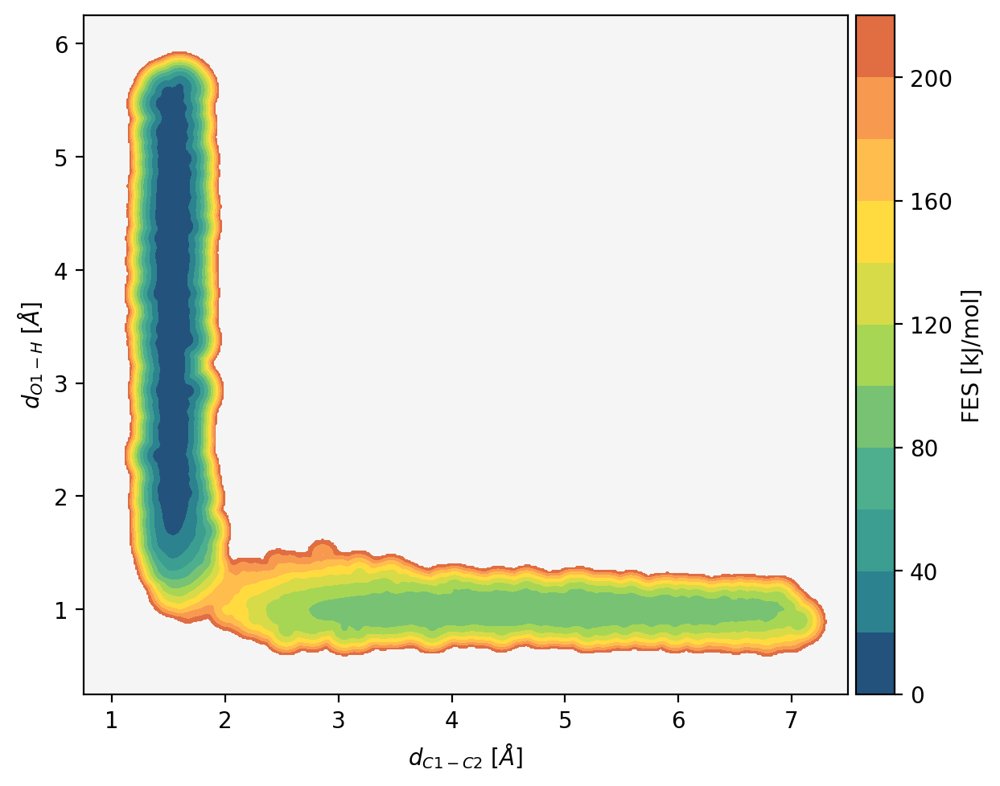

In [0]:
plt.rcParams['axes.facecolor'] = 'white'
#plt.rcParams['axes.facecolor'] = 'whitesmoke'

#create copy
fes2=fes01
max_z=220
fes2[fes2>max_z]=np.NaN

#define plot
fig=plt.figure(figsize=(6.5,6), dpi=200)
ax = fig.add_subplot(111)
#plt.pcolor(x,y,fes2,cm_fessa,vmin=0,vmax=250)
#pp=ax.imshow(np.flipud(fes2),cmap=cm_fessa,extent=[gx_min,gx_max,gy_min,gy_max], vmax=max_z, interpolation='none')
pp= ax.contourf(fes2, levels=13, cmap=cm_fessa, extent=[gx_min,gx_max,gy_min,gy_max])
#pp2=ax.contour(fes2, levels=10, colors='k', linewidths=0.9 , alpha=0.6, extent=[gx_min,gx_max,gy_min,gy_max])
#ax.set_title("Aldol reaction")
ax.set_xlabel(r"$d_{C1-C2}$ [$\AA$]")
ax.set_ylabel(r"$d_{O1-H}$ [$\AA$]")
ax.set_aspect('equal')

from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(pp,cax=cax)
cbar.set_label("FES [kJ/mol]")

plt.savefig("{}/{}.png".format(folder, "fes"), dpi=200,bbox_inches='tight')
#plt.savefig("{}/{}.png".format(folder, "cv0"), dpi=200,bbox_inches='tight')

#### Plot multiple FES

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in greater
  if __name__ == '__main__':
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in greater
  # Remove the CWD from sys.path while we load stuff.


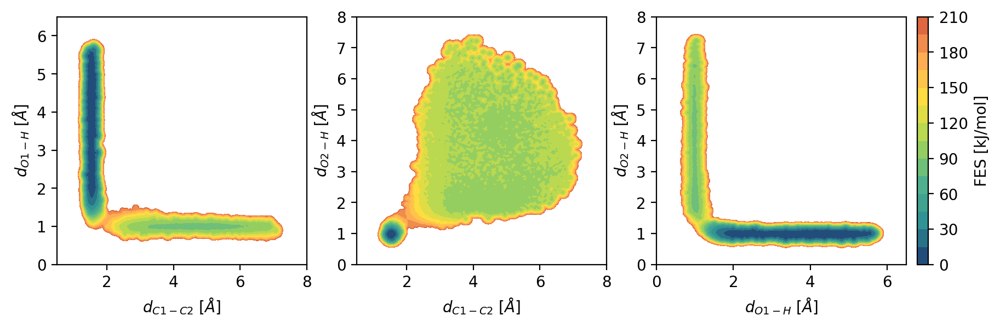

In [0]:
fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(10,3), dpi=200)

fes1=fes01
fes2=fes02
fes3=fes12

max_z=200
fes1[fes1>max_z]=np.NaN
fes2[fes2>max_z]=np.NaN
fes3[fes3>max_z]=np.NaN

pp1=ax1.contourf(fes1, levels=13, cmap=cm_fessa, extent=[cc_min,cc_max,oh1_min,oh1_max]) 
pp2=ax2.contourf(fes2, levels=13, cmap=cm_fessa, extent=[cc_min,cc_max,oh2_min,oh2_max]) 
pp3=ax3.contourf(fes3, levels=13, cmap=cm_fessa, extent=[oh1_min,oh1_max,oh2_min,oh2_max]) 

ax1.set_xlabel(r"$d_{C1-C2}$ [$\AA$]")
ax1.set_ylabel(r"$d_{O1-H}$ [$\AA$]")
ax1.set_xlim(0.5,8)
ax1.set_ylim(0,6.5)

ax2.set_xlabel(r"$d_{C1-C2}$ [$\AA$]")
ax2.set_ylabel(r"$d_{O2-H}$ [$\AA$]")
ax2.set_xlim(0.5,8)
ax2.set_ylim(0.,8)

ax3.set_xlabel(r"$d_{O1-H}$ [$\AA$]")
ax3.set_ylabel(r"$d_{O2-H}$ [$\AA$]")
ax3.set_xlim(0.,6.5)
ax3.set_ylim(0.,8)

#for ax in (ax1,ax2,ax3):
    #ax.set_aspect('equal')
    #ax.xaxis.set_ticks(np.arange(1, 8, 1.))
    #ax.yaxis.set_ticks(np.arange(1, 8, 1.))

#plt.subplots_adjust(wspace=0.1)#,right=0.93)
cbar_ax = fig.add_axes([0.91, 0.125, 0.01, 0.755])
cbar=fig.colorbar(pp1, cax=cbar_ax)
cbar.set_label("FES [kJ/mol]")

plt.savefig("{}/{}.png".format(folder, "fes-multi"), dpi=200,bbox_inches='tight')
plt.show()

### CV ISOLINES

#### Load data

In [0]:
folder=main_folder+"aldol/"

data_meta=np.loadtxt(folder+"COLVARmeta")

(458850,)


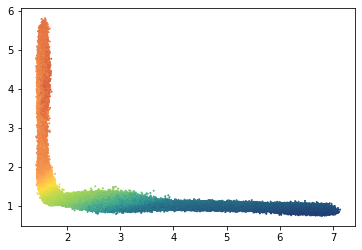

In [0]:
data=data_meta
ev=1
fr=500000
time,d_cc,d_oo,d_oh1,d_oh2,opes_ci,opes_bias,wall_bias,deeplda = data[fr::ev,0],data[fr::ev,7],data[fr::ev,8],data[fr::ev,9],data[fr::ev,10],data[fr::ev,12],data[fr::ev,14],data[fr::ev,15],data[fr::ev,18]
print(time.shape)
plt.figure()
plt.scatter(d_cc,d_oh1,c=deeplda,s=1,cmap=cm_fessa)

#### Interpolate

In [0]:
#interpolate 
from scipy import interpolate

cv_x=d_cc
cv_y=d_oh1

gx_min,gx_max=0.75,7.5
gy_min,gy_max=0.25,6.25
grid_bin=200
grid_x=np.linspace(gx_min,gx_max,grid_bin)
grid_y=np.linspace(gy_min,gy_max,grid_bin)
x,y=np.meshgrid(grid_x,grid_y)

grid_interp = interpolate.griddata(np.stack([cv_x,cv_y],axis=-1), deeplda, (x,y), method='linear')
#interp = interpolate.interp2d(cv_x,cv_y,deeplda)

#### MFEP and ISOLINES

In [0]:
folder=main_folder+"aldol/"

irc_x,irc_y = np.loadtxt(folder+"COLVAR.IRC",unpack=True,usecols=(7,9))
mfep_x,mfep_y = np.loadtxt(folder+"mfep-new-200-0.5e3.dat",unpack=True,usecols=(0,1))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: UserWarning: The following kwargs were not used by contour: 'label'
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: UserWarning: The following kwargs were not used by contour: 'label'


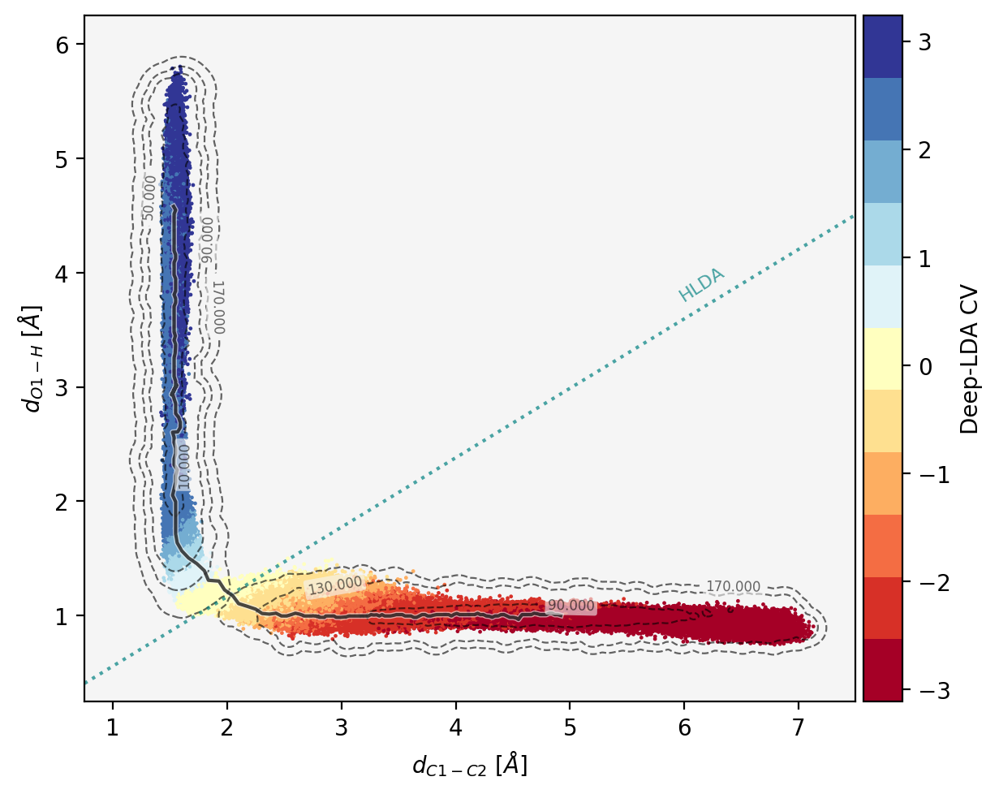

In [0]:
from matplotlib import cm
import matplotlib.patheffects as mpe

fig=plt.figure(figsize=(6.5,6), dpi=200)
ax = fig.add_subplot(111)
plt.rcParams['axes.facecolor'] = 'whitesmoke'

# == (1) FES CONTOUR ==
fes=fes01
mask_a=np.full_like(fes,np.NaN)
mask_b=np.full_like(fes,np.NaN)

for i in range(grid_bin):
    for j in range(grid_bin):
        if (x[i,j]<2.2):
            mask_a[i,j]=1
        elif (x[i,j]>2.2):
            mask_b[i,j]=1

#CS=ax.contour(fes, levels=[20,60,100,150], colors='black', extent=[gx_min,gx_max,gy_min,gy_max],alpha=0.6,linewidths=0.8,linestyles='dashed',label='FES') # for 0.03 sigma
#CS=ax.contour(fes, levels=[10,50,90,125,155], colors='black', extent=[gx_min,gx_max,gy_min,gy_max],alpha=0.6,linewidths=0.8,linestyles='dashed',label='FES') # for 0.025 sigma
CS=ax.contour(fes * mask_a, levels=[10,50,90,170], colors='black', extent=[gx_min,gx_max,gy_min,gy_max],alpha=0.6,linewidths=0.8,linestyles='dashed',label='FES') # for 0.025 sigma
CS2=ax.contour(fes * mask_b, levels=[90,130,170], colors='black', extent=[gx_min,gx_max,gy_min,gy_max],alpha=0.6,linewidths=0.8,linestyles='dashed',label='FES') # for 0.025 sigma

clab=ax.clabel(CS, inline=True, fontsize=6, inline_spacing=10 )
clab2=ax.clabel(CS2, inline=True, fontsize=6, inline_spacing=10 )

[txt.set_bbox(dict(facecolor='whitesmoke', edgecolor='none', alpha=0.6, pad=0.2,boxstyle='round')) for txt in clab]
[txt.set_bbox(dict(facecolor='whitesmoke', edgecolor='none', alpha=0.6, pad=0.2, boxstyle='round')) for txt in clab2]

#-- differentiate label colors
#ax.clabel(CS, CS.levels[1:], inline=True, fontsize=5, inline_spacing=10 )
#ax.clabel(CS,CS.levels[0::4], colors='gold', inline=True, fontsize=6, inline_spacing=10)

#ax.clabel(CS2,CS2.levels[1:], inline=True, fontsize=6, inline_spacing=10, )
#ax.clabel(CS2,CS2.levels[0::4], colors='gold', inline=True, fontsize=6, inline_spacing=10)

h1,_ = CS.legend_elements()

# == (2) SCATTER w/DEEP-LDA ==
cmap = cm.get_cmap('RdYlBu', 11)
pp=ax.scatter(d_cc,d_oh1,c=deeplda,cmap=cmap, s=0.5,label='Deep-LDA')

# == (3) HLDA LINE ==
m1=0.48/0.79
m2=-1./m1

# -- arrow
#ax.arrow(2.5,1.25,-0.65,-m2*0.65,head_width=0.15,head_length=0.15,shape='right',color='teal',label='HLDA') #fill=False)
#ax.arrow(2.5-0.65,1.25-m2*0.65,0.65,m2*0.65,head_width=0.15,head_length=0.15,shape='right',color='teal')
#ax.text(2.2, 2,'HLDA',fontdict={'color':'teal','size':8},rotation=-58, rotation_mode='anchor')

# -- boundary line
x1=np.linspace(gx_min,gx_max)
y1=m1*x1-0.05
plt.plot(x1,y1,linestyle='dotted',alpha=0.7,color='teal')
ax.text(6, 3.75,'HLDA',fontdict={'color':'teal','size':8, 'alpha':0.7},rotation=33, rotation_mode='anchor')

# == (4) IRC/MFEP ==
#ax.plot(irc_x,irc_y,linestyle='solid',c='k',alpha=0.7,label='IRC')
ax.plot(mfep_x,mfep_y,linestyle='solid',c='black',alpha=0.7,label='MFEP',path_effects=[mpe.withStroke(linewidth=2.5, foreground='whitesmoke',alpha=0.6)] )
#ax.plot(mfep_x,mfep_y,linestyle='dashed',c='k',alpha=0.7,label='MFEP')


# == PROPERTIES ==
#ax.set_title("Aldol reaction")
#ax.set_xlabel(r"C-C distance [$\AA$]")
ax.set_xlabel(r"$d_{C1-C2}$ [$\AA$]")
#ax.set_ylabel(r"O1-H distance [$\AA$]")
ax.set_ylabel(r"$d_{O1-H}$ [$\AA$]")
ax.set_aspect('equal')

#ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.085), ncol=3)
#ax.legend([h1], ['FES'])

# -- CBAR
from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(pp,cax=cax)
cbar.set_label("Deep-LDA CV")

plt.savefig("{}/{}.png".format(folder, "cv4"), dpi=200,bbox_inches='tight')

### TRAJECTORY

(191770,)


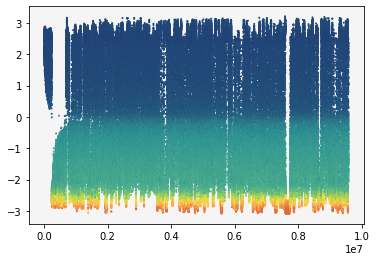

In [0]:
data=data_meta
ev=5
fr=1
upto=9000000
time,c_cc,c_oh1,d_cc,d_oo,d_oh1,d_oh2,opes_ci,opes_bias,wall_bias,deeplda = data[fr:upto:ev,0],data[fr:upto:ev,4],data[fr:upto:ev,5],data[fr:upto:ev,7],data[fr:upto:ev,8],data[fr:upto:ev,9],data[fr:upto:ev,10],data[fr:upto:ev,12],data[fr:upto:ev,14],data[fr:upto:ev,15],data[fr:upto:ev,18]
print(time.shape)
plt.figure()
plt.scatter(time,deeplda,c=d_cc,s=1,cmap=cm_fessa)

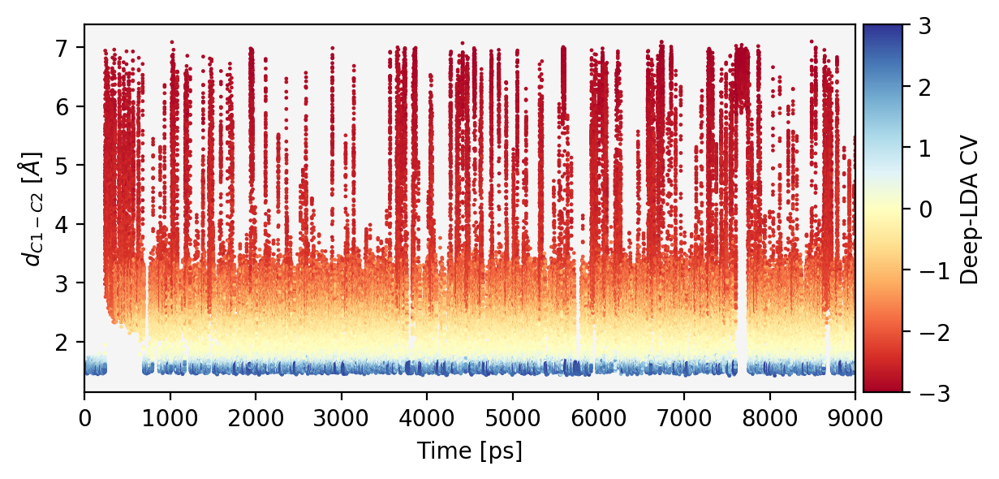

In [0]:
fig=plt.figure(figsize=(6.5,3), dpi=200)
ax = fig.add_subplot(111)
plt.rcParams['axes.facecolor'] = 'whitesmoke'

#cmap = cm.get_cmap('RdYlBu', 7)
ppp=ax.scatter(time/1000,d_cc,c=deeplda,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.)

ax.set_xlim(0,9000)
#ax.set_title("Deep-LDA simulation")
ax.set_xlabel("Time [ps]")
ax.set_ylabel(r"$d_{C1-C2}$ [$\AA$]")

# -- CBAR
from mpl_toolkits.axes_grid1 import make_axes_locatable
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(ppp,cax=cax)
cbar.set_label("Deep-LDA CV")

plt.savefig("{}/{}.png".format(folder, "traj1"), dpi=200,bbox_inches='tight')

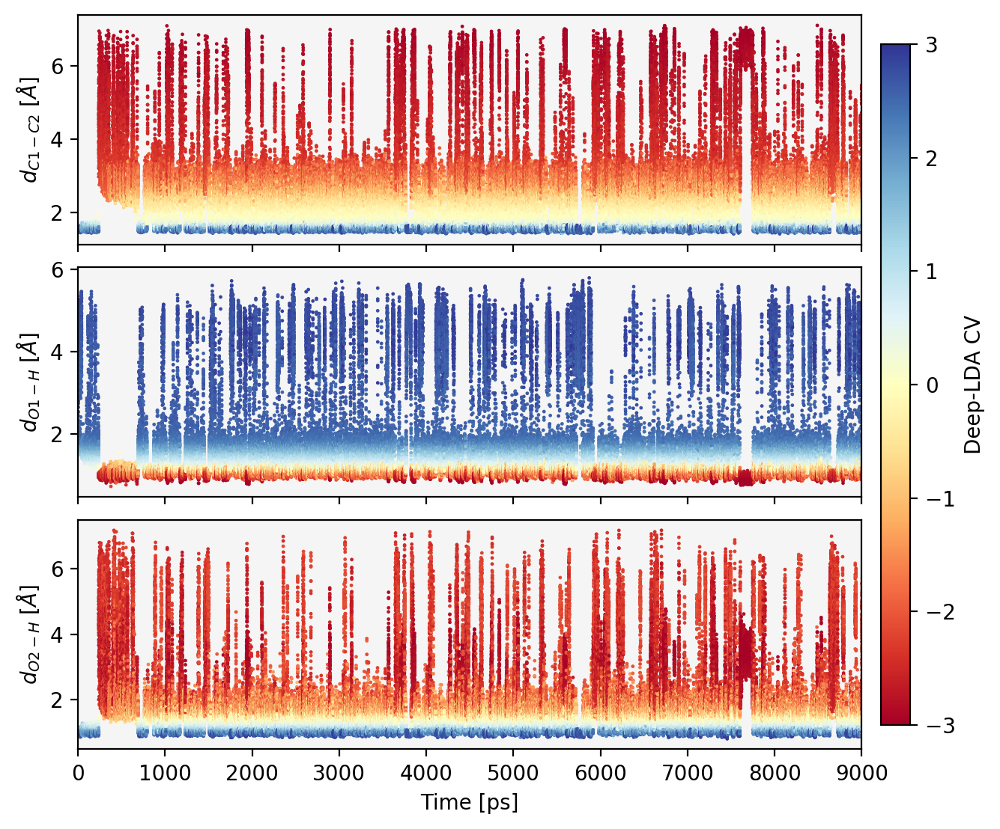

In [0]:
fig, (ax1,ax2,ax3) = plt.subplots(3,sharex=True, figsize=(6.5,6.5), dpi=200)

pp1=ax1.scatter(time/1000,d_cc,c=deeplda,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.)
pp2=ax2.scatter(time/1000,d_oh1,c=deeplda,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.)
pp3=ax3.scatter(time/1000,d_oh2,c=deeplda,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.)

ax1.set_xlim(0,9000)
#ax.set_title("Deep-LDA simulation")
ax3.set_xlabel("Time [ps]")

ax1.set_ylabel(r"$d_{C1-C2}$ [$\AA$]")
ax2.set_ylabel(r"$d_{O1-H}$ [$\AA$]")
ax3.set_ylabel(r"$d_{O2-H}$ [$\AA$]")

plt.subplots_adjust(hspace=0.1,right=0.93)
cbar_ax = fig.add_axes([0.95, 0.15, 0.03, 0.7])
cbar=fig.colorbar(pp3, cax=cbar_ax)
cbar.set_label("Deep-LDA CV")

plt.savefig("{}/{}.png".format(folder, "traj2"), dpi=200,bbox_inches='tight')
plt.show()

### Comparison w/HLDA

In [0]:
folder=main_folder+"aldol/"

data_meta=np.loadtxt(folder+"COLVARmeta")
data_3cv=np.loadtxt(folder+"COLVARmeta_3cv")
data_hlda=np.loadtxt(folder+"COLVARmeta_HLDA")

In [0]:
ev1=10
fr=0
upto1,upto2=900000,90000
time1,d_cc1,deeplda1,ci1 = data_meta[fr:upto1:ev1,0],data_meta[fr:upto1:ev1,7],data_meta[fr:upto1:ev1,18],data_meta[fr:upto1:ev1,12]
time2,d_cc2,deeplda2,ci2 = data_3cv[:upto2,0],data_3cv[:upto2,7],data_3cv[:upto2,18],data_3cv[:upto2,12]
time3,d_cc3,deeplda3,ci3 = data_hlda[:upto2,0],data_hlda[:upto2,7],data_hlda[:upto2,18],data_hlda[:upto2,12]
print(data_meta.shape,data_3cv.shape,data_hlda.shape)
print(time1.shape,time2.shape,time3.shape)

(958850, 22) (92694, 22) (92314, 22)
(90000,) (90000,) (90000,)


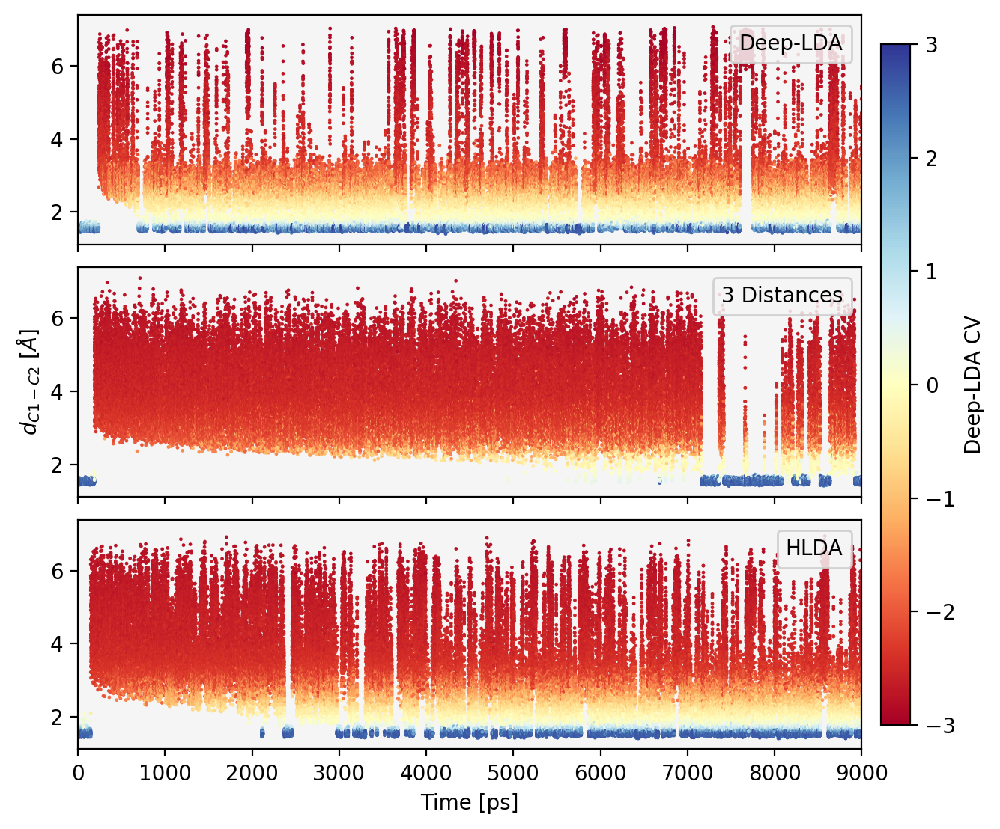

In [0]:
fig, (ax1,ax2,ax3) = plt.subplots(3,sharex=True,sharey=True, figsize=(6.5,6.5), dpi=200)

pp1=ax1.scatter(time1/1000,d_cc1,c=deeplda1,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.,label='Deep-LDA')
pp2=ax2.scatter(time2/1000,d_cc2,c=deeplda2,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.,label='3 Distances')
pp3=ax3.scatter(time3/1000,d_cc3,c=deeplda3,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.,label='HLDA')

ax1.set_xlim(0,9000)
#ax.set_title("Deep-LDA simulation")
ax3.set_xlabel("Time [ps]")

ax2.set_ylabel(r"$d_{C1-C2}$ [$\AA$]")

for ax in (ax1,ax2,ax3):
    ax.legend(loc='upper right',framealpha=0.85,markerscale=0,handletextpad=-2.0)

plt.subplots_adjust(hspace=0.1,right=0.93)
cbar_ax = fig.add_axes([0.95, 0.15, 0.03, 0.7])
cbar=fig.colorbar(pp3, cax=cbar_ax)
cbar.set_label("Deep-LDA CV")

plt.savefig("{}/{}.png".format(folder, "traj-comparison"), dpi=200,bbox_inches='tight')
plt.show()

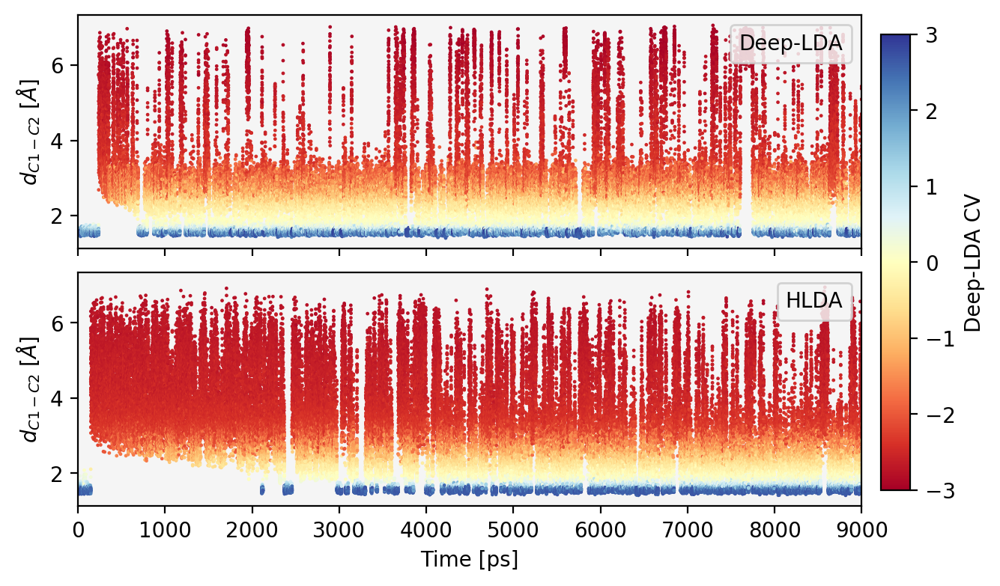

In [0]:
fig, (ax1,ax2) = plt.subplots(2,sharex=True,sharey=True, figsize=(6.5,4.35), dpi=200)

pp1=ax1.scatter(time1/1000,d_cc1,c=deeplda1,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.,label='Deep-LDA')
#pp2=ax2.scatter(time2/1000,d_cc2,c=deeplda2,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.,label='3 Distances')
pp3=ax2.scatter(time3/1000,d_cc3,c=deeplda3,s=0.5,cmap='RdYlBu',vmin=-3.,vmax=3.,label='HLDA')

ax1.set_xlim(0,9000)
#ax.set_title("Deep-LDA simulation")
ax2.set_xlabel("Time [ps]")

ax1.set_ylabel(r"$d_{C1-C2}$ [$\AA$]")
ax2.set_ylabel(r"$d_{C1-C2}$ [$\AA$]")

for ax in (ax1,ax2):
    ax.legend(loc='upper right',framealpha=0.85,markerscale=0,handletextpad=-2.0)

plt.subplots_adjust(hspace=0.1,right=0.93)
cbar_ax = fig.add_axes([0.95, 0.15, 0.03, 0.7])
cbar=fig.colorbar(pp3, cax=cbar_ax)
cbar.set_label("Deep-LDA CV")

plt.savefig("{}/{}.png".format(folder, "traj-comparison-2"), dpi=200,bbox_inches='tight')
plt.show()

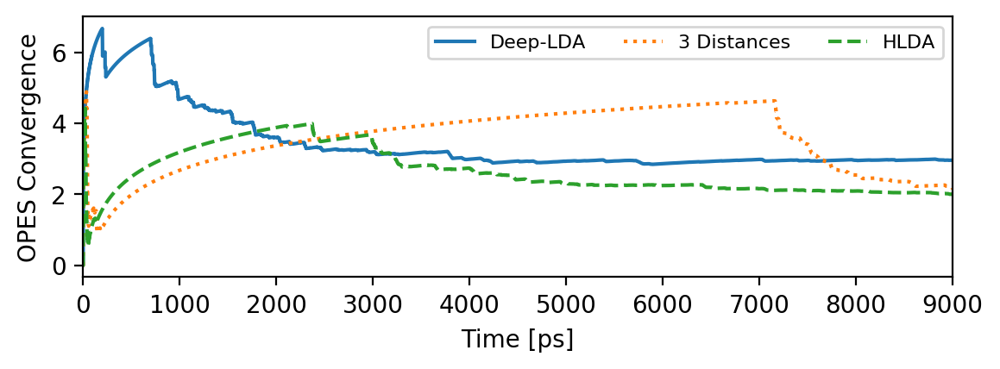

In [0]:
fig, (ax) = plt.subplots(1, figsize=(6.5,2), dpi=200)

ax.plot(time1/1000,ci1,label='Deep-LDA')
ax.plot(time2/1000,ci2,label='3 Distances',linestyle='dotted')
ax.plot(time3/1000,ci3,label='HLDA',linestyle='dashed')

ax.set_xlim(0,9000)
ax.set_xlabel("Time [ps]")
ax.set_ylabel("OPES Convergence")

ax.legend(loc='upper right',ncol=3,fontsize=8)


plt.savefig("{}/{}.png".format(folder, "traj-comparison-ci"), dpi=200,bbox_inches='tight')
plt.show()

### FES along MFEP

In [0]:
folder=main_folder+"aldol/"

path_x,path_fes = np.loadtxt(folder+"path-mfep-new-200-0.5e3.dat",unpack=True,usecols=(0,1))

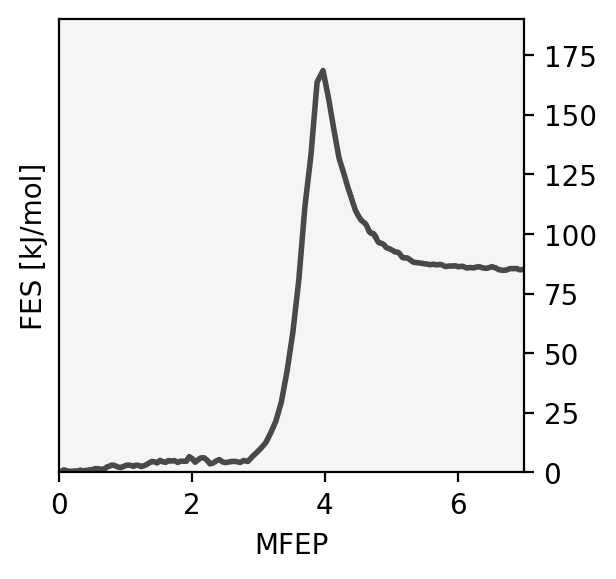

In [0]:
fig=plt.figure(figsize=(3,3), dpi=200)
ax = fig.add_subplot(111)
plt.rcParams['axes.facecolor'] = 'whitesmoke'

ax.plot(path_x,path_fes,linewidth=2,c='black',alpha=0.7,label='MFEP',path_effects=[mpe.withStroke(linewidth=2.5, foreground='whitesmoke',alpha=0.6)])

ax.set_xlim(0,7)
ax.set_ylim(0,190)
ax.set_xlabel("MFEP")
ax.set_ylabel("FES [kJ/mol]")

#ax.yaxis.set_label_position("right")
ax.yaxis.tick_right()

plt.savefig("{}/{}.png".format(folder, "mfep"), dpi=200, bbox_inches='tight')

### FEATURES RANKING

#### Load 

In [0]:
folder=main_folder+"aldol/unbiased/"

normalize=False

n_input=40

# -- Loading and preprocessing --
distA=np.loadtxt(folder+"INPUTS.R",usecols=range(1,n_input+1))
distB=np.loadtxt(folder+"INPUTS.P",usecols=range(1,n_input+1))

print("A",distA.shape)
print("B",distB.shape)

if normalize:
    # normalize inputs
    Max=np.amax(np.concatenate([distA,distB],axis=0),axis=0)
    Min=np.amin(np.concatenate([distA,distB],axis=0),axis=0)

    Mean=(Max+Min)/2.
    Range=(Max-Min)/2.
    Range[Range<1e-6]=1.

# create labels
lA=np.zeros_like(distA[:,0])
lB=np.ones_like(distB[:,0])

dist=np.concatenate([distA,distB],axis=0)
dist_label=np.concatenate([lA,lB],axis=0)

p = np.random.permutation(len(dist))
dist, dist_label = dist[p], dist_label[p]



A (5001, 40)
B (5001, 40)


In [0]:
#LOAD
folder_model=main_folder+"paper/aldol/"

#parameters
categ = 2
eig_num = 1
lambdA = 0.05

# wheter to use CUDA
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# -- Model --
n_hidden=5
n_cv=1
nodes=[n_input,30,20,10,n_hidden]
model = NN_DeepLDA(nodes)
model.set_lda(torch.zeros(n_hidden)) 
checkpoint = torch.load(folder_model+"full_model.pt")

model.load_state_dict(checkpoint['model_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['loss']


ls: cannot access '/content/gdrive/My': No such file or directory
ls: cannot access 'Drive/autoencoder_cvs/paper/aldol/': No such file or directory
40  -->  30 (relu)
30  -->  20 (relu)
20  -->  10 (relu)
10  -->  5 


#### Ranking w/weights

In [0]:
#in_name="CC.0 CC.1 CC.2 OO.0 CO.0 CO.1 CO.2 CO.3 CO.4 CO.5 CH.0 CH.1 CH.2 CH.3 CH.4 CH.5 CH.6 CH.7 CH.8 CH.9 CH.10 CH.11 CH.12 CH.13 CH.14 CH.15 CH.16 CH.17 OH.0 OH.1 OH.2 OH.3 OH.4 OH.5 OH.6 OH.7 OH.8 OH.9 OH.10 OH.11".split()
in_name="C1-C3 C1-C2 C2-C3 O1-O2 C1-O1 C1-O2 C3-O1 C3-O2 C2-01 C2-O2 C1-H2 C1-H3 C1-H4 C1-H C1-H5 C1-H6 C3-H2 C3-H3 C3-H4 C3-H C3-H5 C3-H6 C2-H2 C2-H3 C2-H4 C2-H C2-H5 C2-H6 O1-H2 O1-H3 O1-H4 O1-H O1-H5 O1-H6 O2-H2 O2-H3 O2-H4 O2-H O2-H5 O2-H6".split()
in_name=np.asarray(in_name)
in_num=np.arange(n_input)

rank=np.zeros(n_input)

#compute std to correct for different magnitudes
in_std=np.std(dist,axis=0)
print(in_std)

for i in range(n_input):
    rank[i]= in_std[i] * model.nn[0].weight[:,i].abs().sum().item()

#sort
index=rank.argsort()
in_name = in_name[index]
rank = rank[index]

rank/= np.sum(rank)

print(rank)

[0.06968317 0.68207951 0.27590101 0.15592885 0.02757198 0.26935849
 0.06261703 0.13023375 0.13300973 0.08664992 0.0407326  0.04041704
 0.02800976 0.05334439 0.2308348  0.23227833 0.02999185 0.03120105
 0.03707039 0.22792324 0.10992284 0.11223302 0.22286114 0.2447044
 0.12018784 0.23034055 0.0420273  0.04172756 0.05256341 0.06764523
 0.03326576 0.76194824 0.11198979 0.10853446 0.12880694 0.13359747
 0.12255484 0.69028811 0.03822649 0.03820115]
[0.00364819 0.0037396  0.0041911  0.00420681 0.00426562 0.00454703
 0.00516694 0.00530485 0.00562431 0.00571684 0.00622618 0.00627597
 0.00749638 0.00787215 0.00814739 0.00898625 0.00997714 0.01074994
 0.01188536 0.01415643 0.01491717 0.01553188 0.01632188 0.01753968
 0.01758207 0.01767814 0.01800318 0.01958884 0.02063043 0.02733676
 0.02922324 0.03004069 0.0307257  0.03881826 0.03901217 0.03966551
 0.04013715 0.10664793 0.14200255 0.18041229]


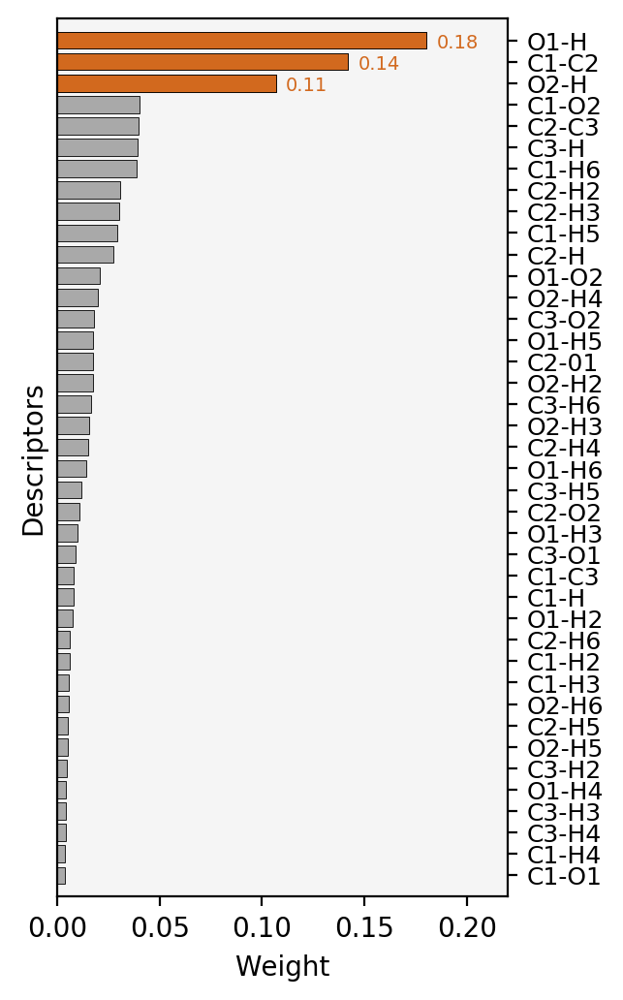

In [0]:
fig=plt.figure(figsize=(3,6), dpi=200)
plt.rcParams['axes.facecolor'] = 'whitesmoke'
ax = fig.add_subplot(111)

in_name2=in_name
in_name

#ax.barh(in_num, rank,color="darkgrey",edgecolor = "k",linewidth=0.3)
#ax.barh(in_num[-3:], rank[-3:], color='darkcyan',edgecolor = "k",linewidth=0.3)

c2='chocolate' #'darkcyan'

ax.barh(in_num, rank,color="darkgrey",edgecolor = "k",linewidth=0.3)
ax.barh(in_num[-3:], rank[-3:], color=c2,edgecolor = "k",linewidth=0.3)

#values to be printed
v=[0.11,0.14,0.18]
for i in range(3,0,-1):
    ax.text(rank[-i]+0.005 , in_num[-i]-0.35 , str(v[-i]), color=c2, fontsize=7)

ax.set_xlim(0,0.22)
ax.set_ylim(-1,40)
ax.set_xlabel('Weight')
ax.set_ylabel('Descriptors')
#ax.set_yticklabels(in_num, in_name, fontsize=5, rotation=0)
ax.set_yticks(in_num)
ax.set_yticklabels(in_name2,fontsize=9)

#ax.yaxis.set_label_position("right")
ax.yaxis.tick_right()

folder=main_folder+"aldol/"
plt.savefig("{}/{}.png".format(folder, "ranking"), dpi=200, bbox_inches='tight')